In [34]:
import os, shutil, zipfile
from glob import glob
from os.path import exists, join
from pprint import pprint as pp
import numpy as np
from bs4 import BeautifulSoup
from pydub import AudioSegment

import matplotlib.pyplot as plt
import wave
import time
import pyperclip ;# #pyperclip.copy('Theclipboard.'); pyperclip.paste()

from pydub import AudioSegment
from pydub.playback import play
from random import randint
import librosa as lbs

In [2]:
#!pip install bs4
#!pip install matplotlib
#!pip install mkl-random
#!pip install mkl-fft
#!pip install ffmpeg-normalize
#!pip install librosa
#!pip install soundfile
#!pip install pyperclip ; #pyperclip.copy('Theclipboard.'); pyperclip.paste()
#sudo apt-get install python-tk

from IPython.display import display, HTML

display(HTML(data="""
<style>
    div#notebook-container    { width: 95%; }
    div#menubar-container     { width: 65%; }
    div#maintoolbar-container { width: 99%; }
</style>
"""))

In [84]:
pPath      ='/home/u/2018/grgDBs/test'
pOut_Folder='/home/u/2018/grgDBs/test_out'

#fnname=join(pPath,"file10.wav") # "810920017105505.wav")
pWavsInput=glob(join(pPath,'*.wav'))
pWavs=glob(join(pOut_Folder,'*.wav'))
if not exists(pOut_Folder): os.makedirs(pOut_Folder)
pWavs=sorted(pWavs)
pp(pWavsInput)
pp(pWavs)


['/home/u/2018/grgDBs/test/810920017105534.wav',
 '/home/u/2018/grgDBs/test/810920017105543.wav',
 '/home/u/2018/grgDBs/test/810920017105532.wav',
 '/home/u/2018/grgDBs/test/810920017105512.wav',
 '/home/u/2018/grgDBs/test/810920017105505.wav']
[]


1. Mở file audio
    - Duyệt theo thư mục
2. Chia theo thời gian đã làm manual
3. Chia theo silent bằng thư viện pydub

In [4]:
#for pWav in pWavs:
#    print(pWav)

from scipy.io import wavfile
fs, data = wavfile.read(fnname)

from IPython.display import Audio

Audio(url=fnname, autoplay=True)


from pydub import AudioSegment
from pydub.playback import play

song = AudioSegment.from_wav(fnname)
play(song)

plt.figure(num=None, figsize=(12, 3), dpi=80, facecolor='w', edgecolor='k')
plt.title('Signal Wave...')
plt.plot(data)
plt.show()

In [5]:

def monoWavRead(filename=''):
    #print('=============trong ham doc file:',filename)
    x,fs = lbs.load(filename,res_type='kaiser_fast')
    if (x.ndim==1):
        samples = x
    else:
        samples = x[:, 0]
    return fs, samples
def write(filename, rate , data  ):
    #print('=============trong ham write file:',filename)
    lbs.output.write_wav(filename, y=data, sr=rate)
    
    #lbs.output.write_wav(filename, y=data.astype(np.int16), sr=rate)
    #print('write wav ok')
    
    #y=data.astype(np.int16): view
    # https://stackoverflow.com/questions/47870412/librosa-cant-open-wav-created-by-librosa
    
def FnNormalize(data0):
    print('FnNormalize -------------------')
    MA=max(data0)
    MI=min(data0)
    if MA<-MI:MA=-MI
    data=data0/MA
    return data

def FnXacDinhViTriCat(data,db=0.03):
    print('FnXacDinhViTriCat -------------------')
    Sile=[]
    for samp in data:
        if (samp> -db) and (samp<db):
            Sile.append(0)
        else:
            Sile.append(1)
    #### - Xac dinh vi tri can cat---------------------------        
    SS=[]
    alpha=0.99                 #~~~~~~~~~~~~~ Threshole ~~~~~~~~~~~~
    VL=0 
    for X in Sile:
        VL=VL*alpha+X*(1-alpha)
        SS.append(VL)

    SS2=[]    
    VL2=0 
    alpha2=0.998               #~~~~~~~~~~~~~ Threshole ~~~~~~~~~~~~
    for X in SS:
        VL2=VL2*alpha2+X*(1-alpha2)
        SS2.append(VL2)
    for k,X in enumerate(SS2):
        if X>db:
            SS[k]=1
        else:
            SS[k]=0
    return SS
def FnFixFirstPoint(SS2):
    print('FnFixFirstPoint---------------------------------')
    #--- Fix first points (=0 la sai, doan dau=1)-------
    SS3=[]
    beta=0.1
    count=0
    f1=0
    MaxN=1#18000
    for samp in SS2:
        if (samp<beta):
            count+=1
            if count>1500:
                SS3.append(0)   
            else:
                SS3.append(MaxN)   
        else:
            SS3.append(MaxN)
            count=0
    #--- shift zero areas ------------------------------
    Delta=2000
    for samp in range(0,len(SS3)-Delta-1):
        if((SS3[samp+Delta]>0)and(SS3[samp]==0))or(SS3[samp]>0):SS2[samp]=MaxN/2
        if((SS3[samp+Delta//2]==0)and(SS3[samp]>0)):            SS2[samp]=0
        #if(samp<10):print(samp, SS2[samp])

    for k,samp in enumerate(SS2):
        if(samp)<MaxN/4:
            SS2[k]=MaxN/4
    return SS2

def FnCutList(SS2,Silent_length=2000):
    print('FnCutList -------------------')
    #Cut list:------------------------------------------
    CUTs=[]
    d=0;c=0
    Dau=0
    MaxN=1
    print(max(SS2), min(SS2), len(SS2))
    for k in range(0,len(SS2)-1):        
        if SS2[k]>SS2[k+1]: d=k            #print(k,SS2[k])
        if SS2[k]<SS2[k+1]: c=k            #print(k,SS2[k])
        if (d>0) and (c>0):            #print('dau,cuoi=',d,c)
            if (c-d>=Silent_length)or(d-c>=Silent_length): ############ Adjust len of silent
                CUTs.append([Dau,d+500])
                Dau=c-500                #print(d,c)
            d=0;c=0     
    SS3=np.zeros(len(SS2))
    for k in range(0,len(SS3)):
        SS3[k]=-MaxN
    for [d,c] in CUTs:
        SS3[d]=-MaxN/10
        SS3[c]=-MaxN/10
    print('len(CUTs)=',len(CUTs))    
    return [CUTs,SS3]
def format_seconds_to_hhmmss(seconds):
    hours = seconds // (60*60)
    seconds %= (60*60)
    minutes = seconds // 60
    seconds %= 60
    if hours>0:
        return "%02i.%02i.%04.1f" % (hours, minutes, seconds)
    else:
        if minutes>0:
            return "%02i.%04.1f" % (minutes, seconds)
        else:
            return "%04.1f" % (seconds)

def FnPlot(dat):
    fig=plt.figure(num=None, figsize=(30,5), facecolor='w', edgecolor='k')
    plt.plot(dat)
    plt.show()
def FnPlotM(DATs):
    fig=plt.figure(num=None, figsize=(30, 5), facecolor='w', edgecolor='k')
    for dat in DATs:
        plt.plot(dat)
    plt.show()

In [85]:
saveFigure=1 #### Set=1 to save that sement audio to png 
for fn in pWavsInput:
    print(fn)
    #fs, data = wavfile.read('/home/u/2018/grgDBs/test/810920017105520.wav' )#fnname)
    #fn='/home/u/2018/grgDBs/test/810920017105543.wav'
    #data = AudioSegment.from_file(fn)
    #data.export(fn, format="wav")
    #fs, data = wavfile.read('/home/u/2018/grgDBs/test/810920017105520.wav' )#fnname)
    # data rang: (-18743, 17930)
    #---------------------------------------------------
    fs, data0 = monoWavRead(fn) 
    #print(max(data0),min(data0),fs,len(data0))
    #data0=data0[:5000000]
    #print(max(data0),min(data0),fs,len(data0))

    data=FnNormalize(data0)
    #print(max(data),min(data))

    db=0.02         ############## Threshold=1000, phan biet tin hieu va nhieu
    SS2=FnXacDinhViTriCat(data,db) 
    #print('len(SS2)=',len(SS2))
    #FnPlotM([data,SS2])
    SS2= FnFixFirstPoint(SS2)
    #FnPlotM([data,SS2])
    CUTs,SS3 = FnCutList(SS2)
    #print('len(CUTs[{}],SS3[{}])'.format(len(CUTs),len(SS3)))

    #================================================================================================

    #print('FnCutList -------------------')
    Secments=len(CUTs)
    MaxDuaration=len(data)/fs
    #print('Secments=',Secments)
    for k in range(Secments):
        X=data[CUTs[k][0]:CUTs[k][1]]
        outfile=fn.split('/')[-1]
        duration0 = format_seconds_to_hhmmss(CUTs[k][0] / float(fs))
        duration1 = format_seconds_to_hhmmss(CUTs[k][1] / float(fs))
        if (Secments>99):
            sFn=    "_{0:03d}_{1:03d}_({2}-{3})".format(Secments,k,duration0,duration1)
        else:
            sFn=    "_{0:02d}_{1:02d}_({2}-{3})".format(Secments,k,duration0,duration1)
        outfile=outfile.replace('.wav',sFn+'.wav')
        #print(outfile)
        write(filename = join(pOut_Folder, outfile), rate = fs, data = X)
    outfile, fs, len(data),'second=',len(data)/fs
    if (saveFigure==1):
        fig=plt.figure(num=None, figsize=(30, 5), facecolor='w', edgecolor='k')
        plt.plot(X)
        outfile=outfile.replace('.wav','.png')
        fig.savefig(join(pOut_Folder, outfile), format='png', dpi=200) 

print('Done! Produce: Wav, png')

/home/u/2018/grgDBs/test/810920017105534.wav
FnNormalize -------------------
FnXacDinhViTriCat -------------------
FnFixFirstPoint---------------------------------
FnCutList -------------------
0.5 0.25 4917591
len(CUTs)= 53
/home/u/2018/grgDBs/test/810920017105543.wav
FnNormalize -------------------
FnXacDinhViTriCat -------------------
FnFixFirstPoint---------------------------------
FnCutList -------------------
0.5 0.25 3614436
len(CUTs)= 58
/home/u/2018/grgDBs/test/810920017105532.wav
FnNormalize -------------------
FnXacDinhViTriCat -------------------
FnFixFirstPoint---------------------------------
FnCutList -------------------
0.5 0.25 3785103
len(CUTs)= 69
/home/u/2018/grgDBs/test/810920017105512.wav
FnNormalize -------------------
FnXacDinhViTriCat -------------------
FnFixFirstPoint---------------------------------
FnCutList -------------------
1 0.25 4342086
len(CUTs)= 81
/home/u/2018/grgDBs/test/810920017105505.wav
FnNormalize -------------------
FnXacDinhViTriCat -------

for kk in range(len(CUTs)):
    fig=plt.figure(num=None, figsize=(30, 5), facecolor='w', edgecolor='k')
    plt.title('Zero...')
    Fr=100000
    d=kk*Fr
    t=(kk+1)*Fr
    plt.plot(data[d:t])
    plt.plot(SS2[d:t])
    plt.plot(SS3[d:t])
    plt.show()
print(len(SS2))
fig.savefig(join(pOut_Folder,'myimage.svg'), format='svg', dpi=1200)#svg

k= 0


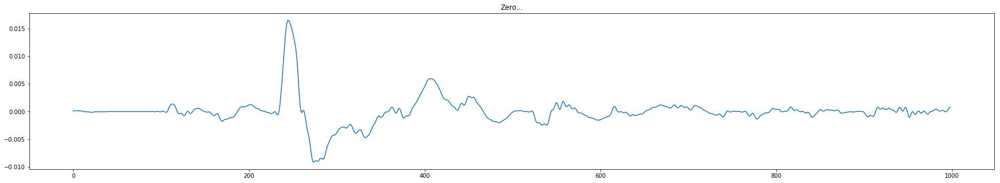

k= 1


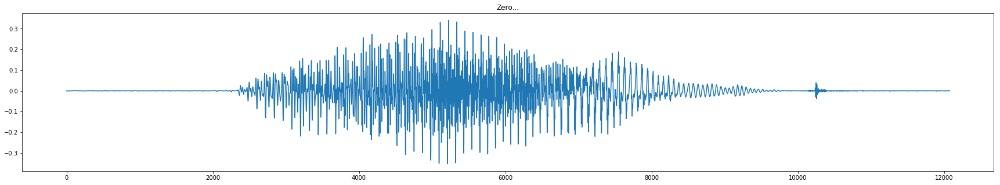

k= 2


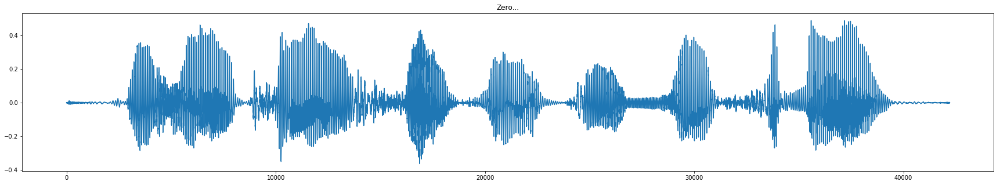

k= 3


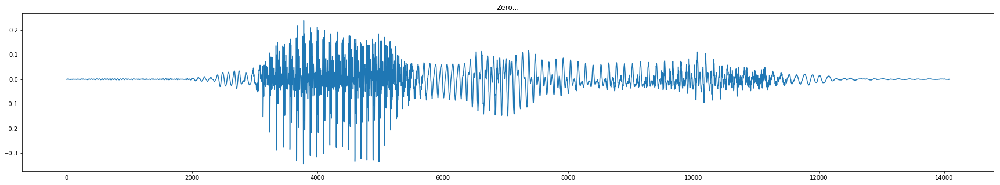

k= 4


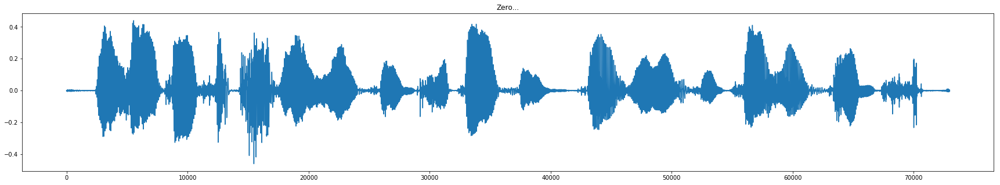

k= 5


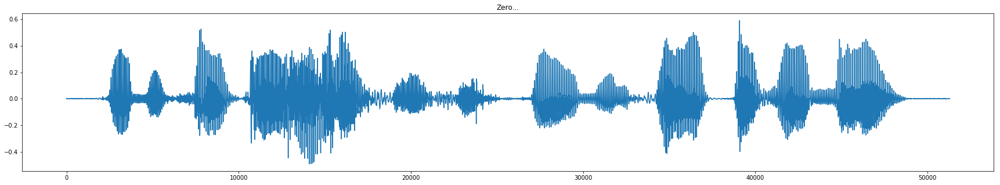

k= 6


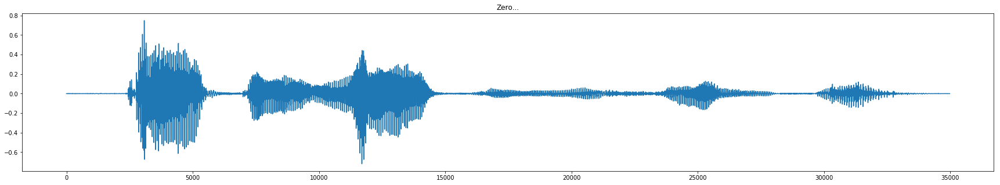

k= 7


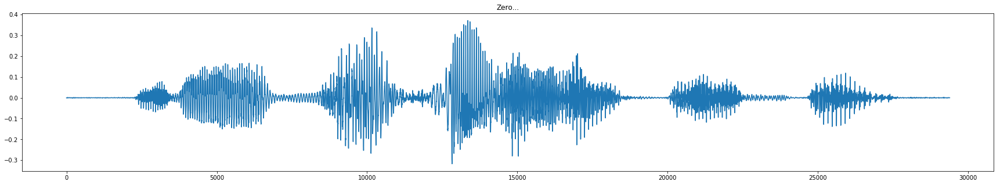

k= 8


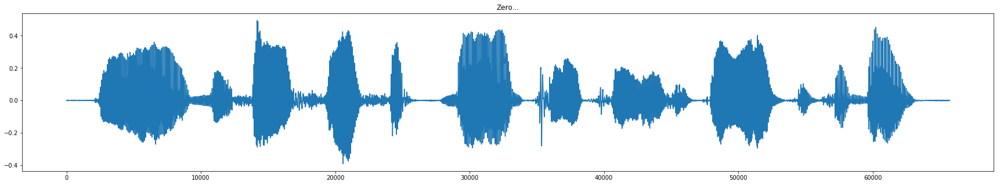

k= 9


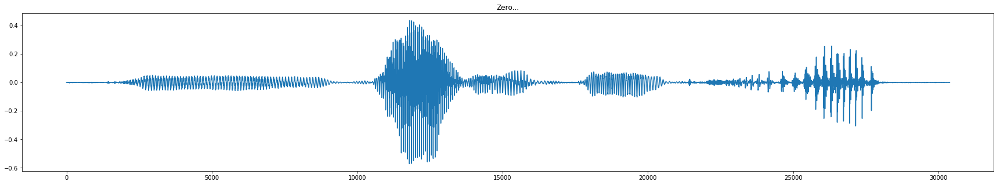

k= 10


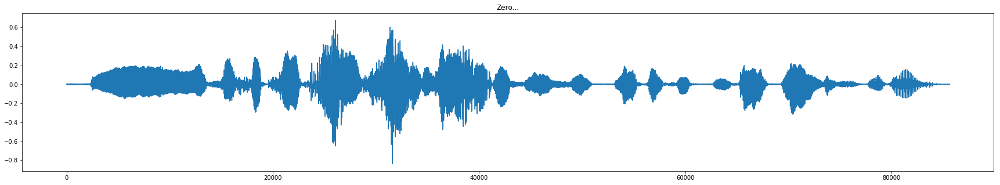

k= 11


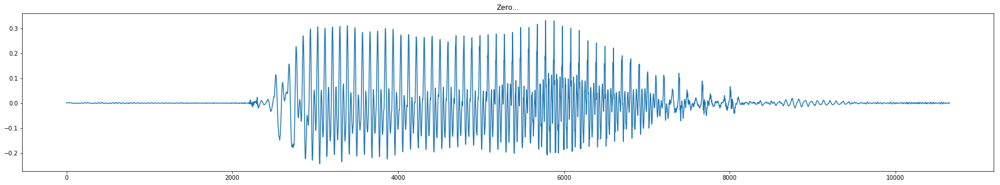

k= 12


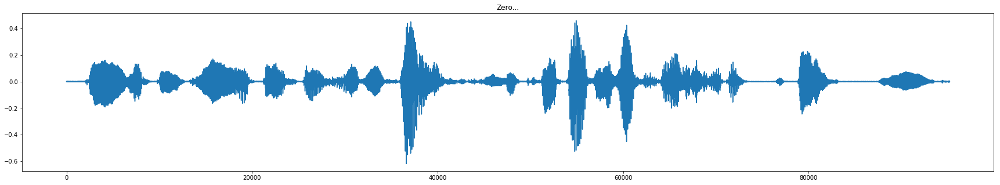

k= 13


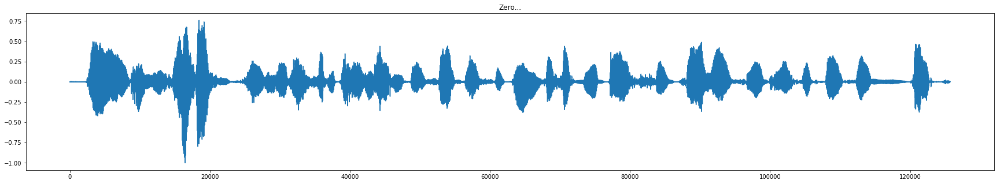

k= 14


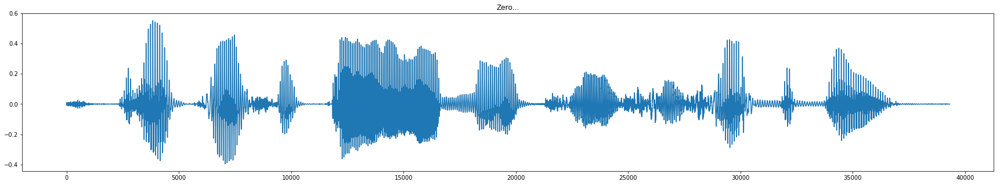

k= 15


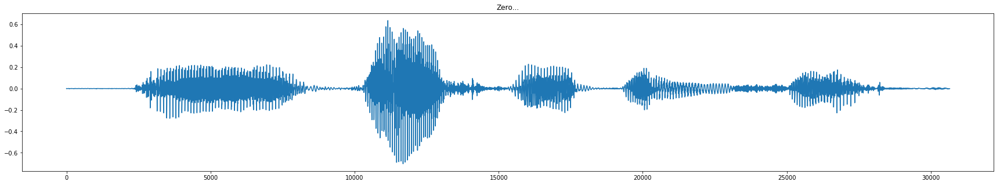

k= 16


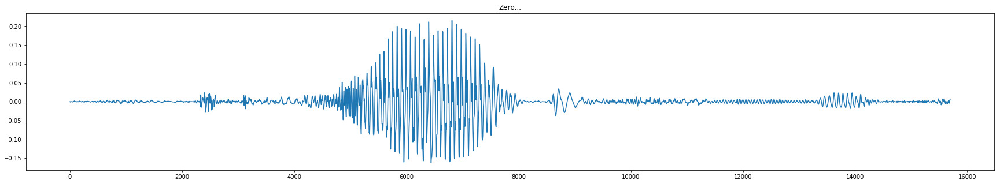

k= 17


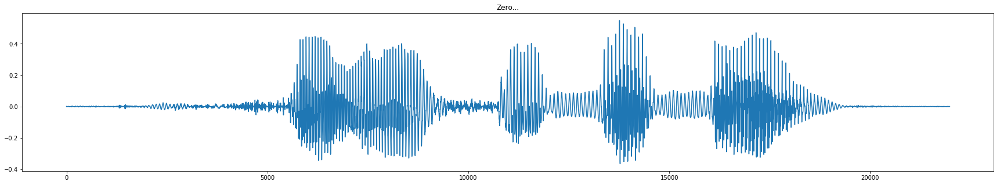

k= 18


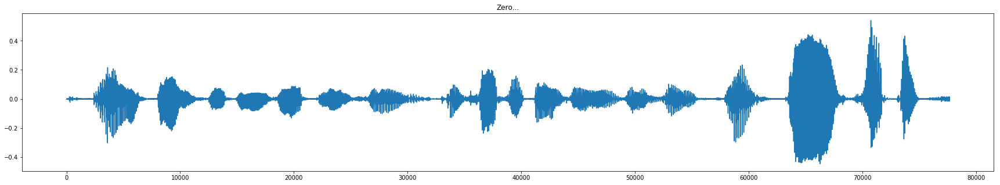

k= 19


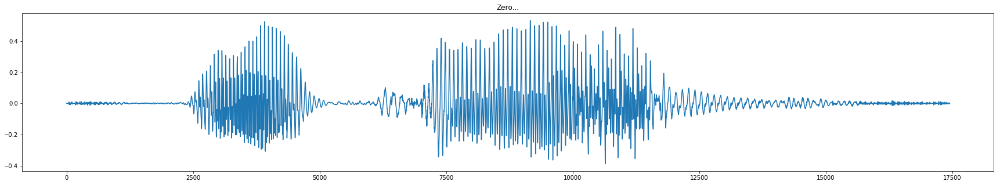

k= 20


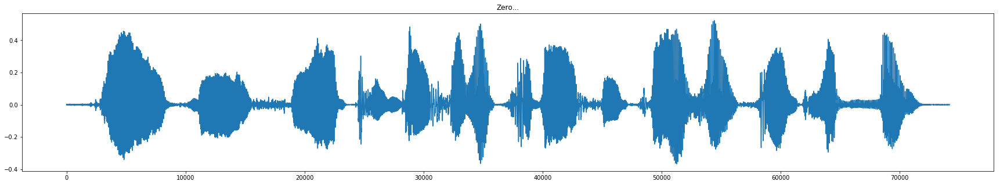

k= 21


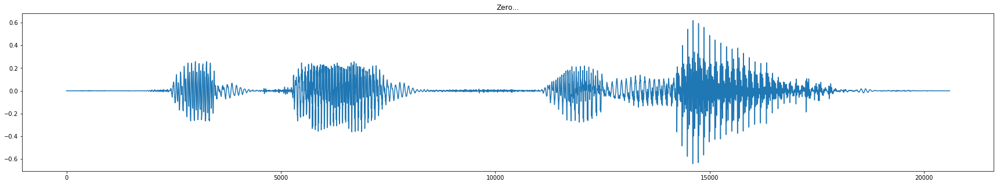

k= 22


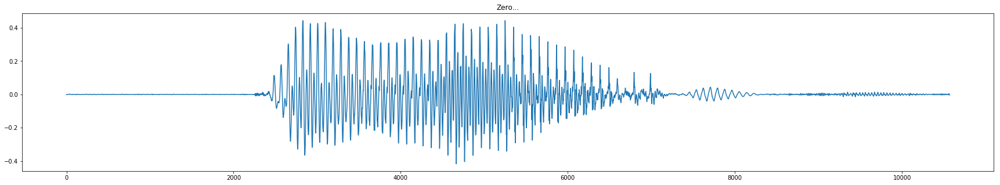

k= 23


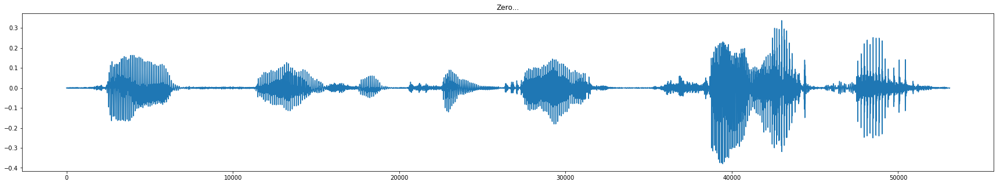

k= 24


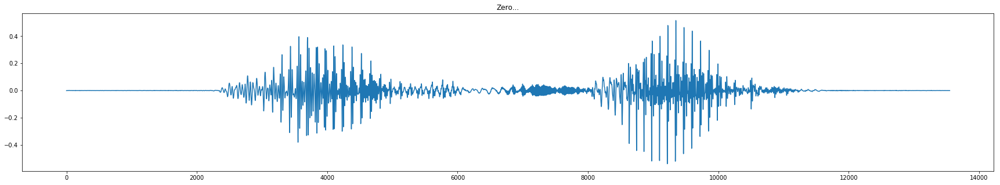

k= 25


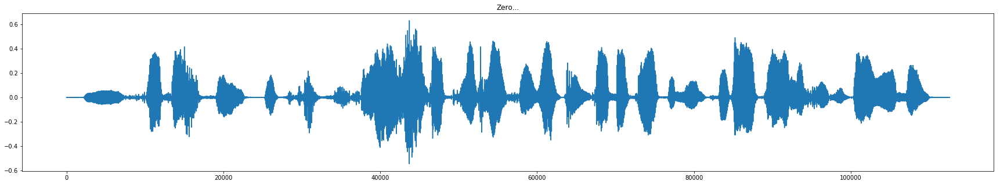

k= 26


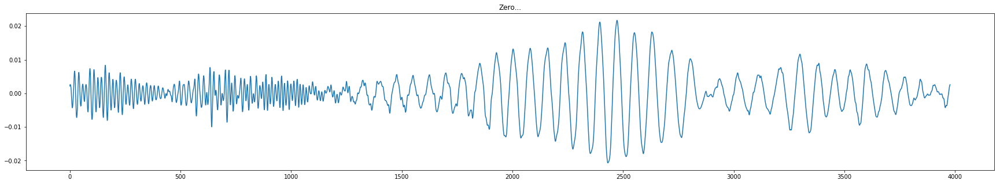

k= 27


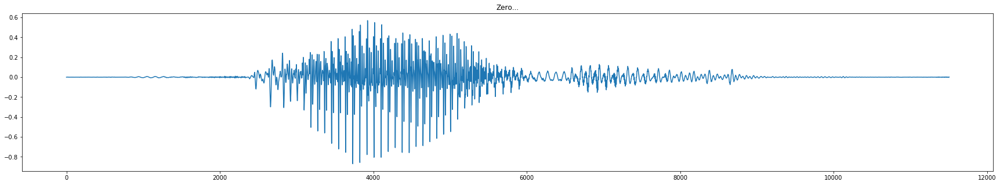

k= 28


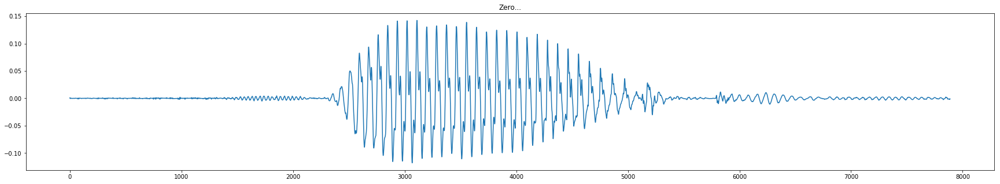

k= 29


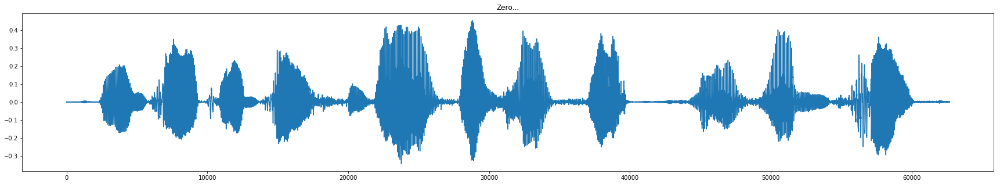

k= 30


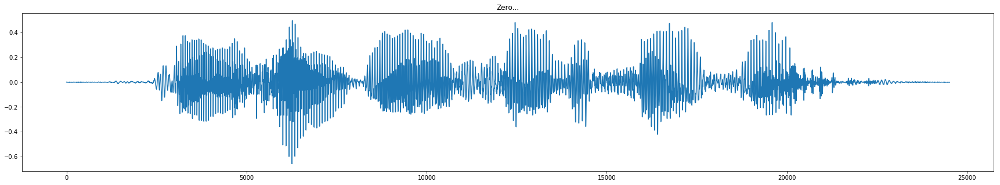

k= 31


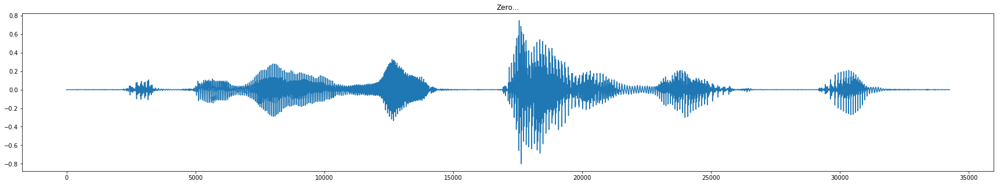

k= 32


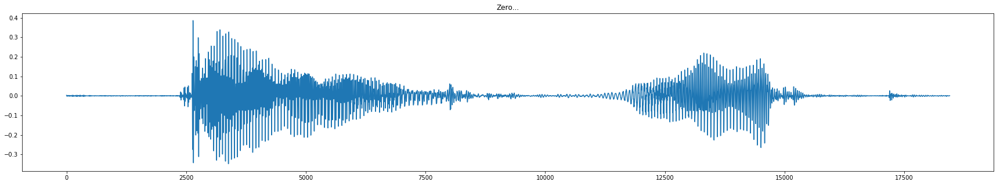

k= 33


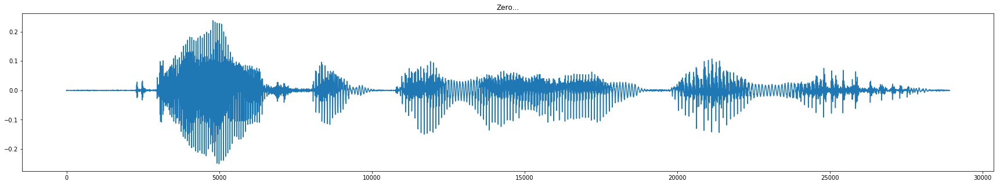

k= 34


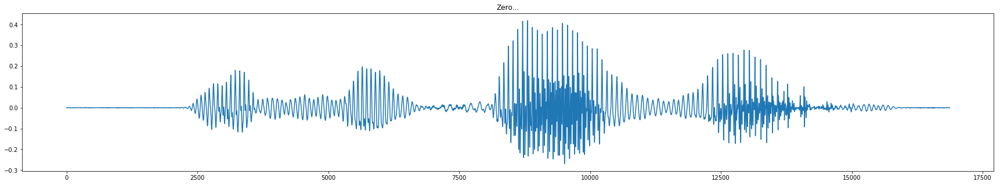

k= 35


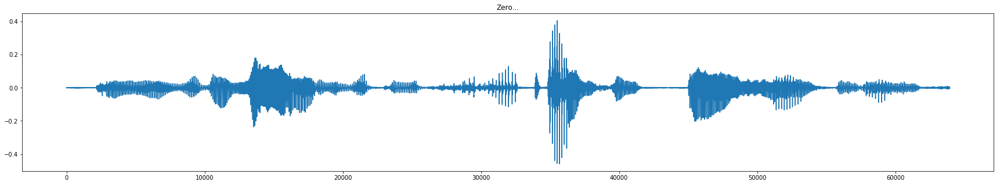

k= 36


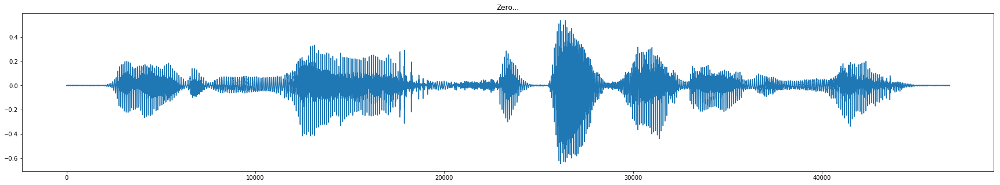

k= 37


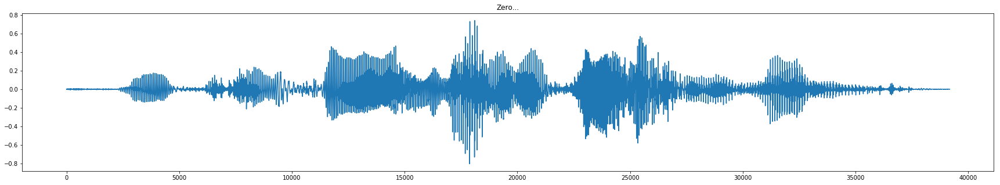

k= 38


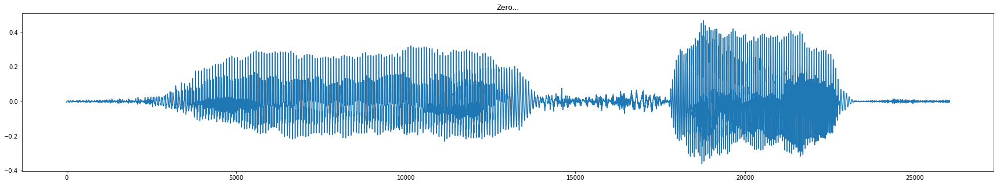

k= 39


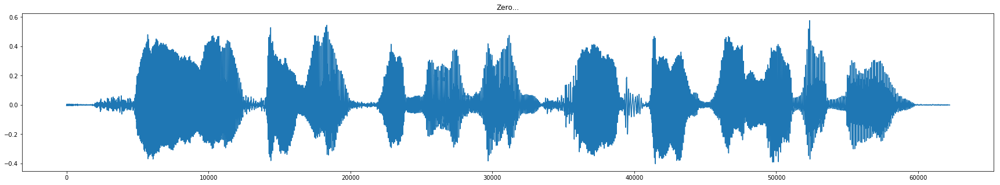

k= 40


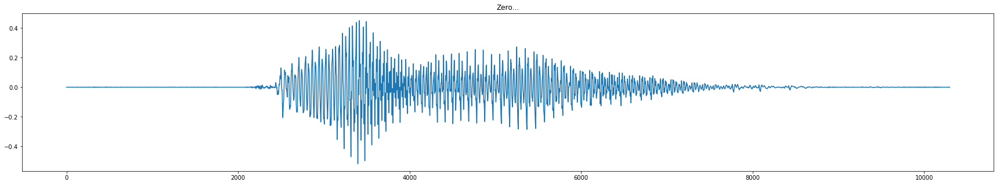

k= 41


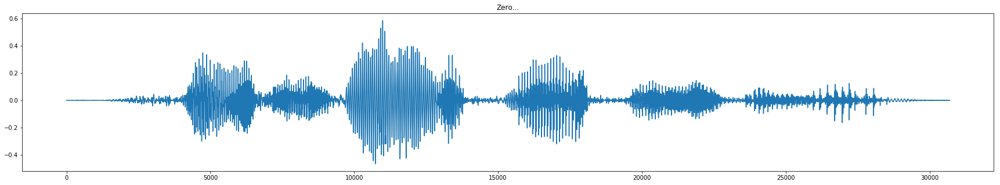

k= 42


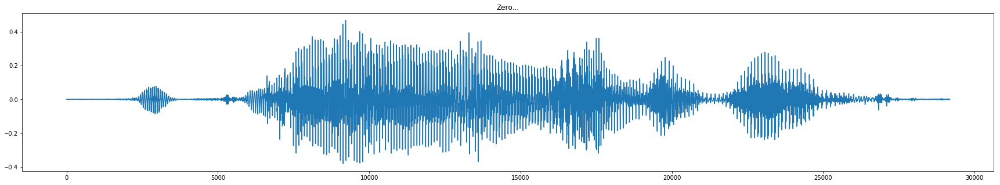

k= 43


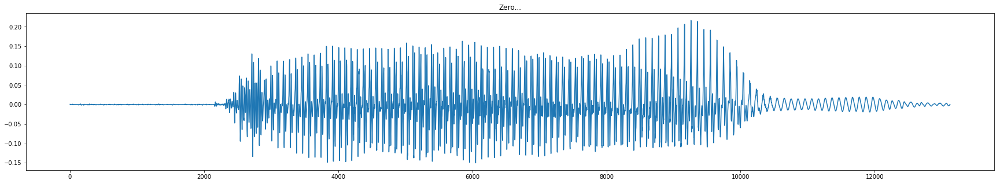

k= 44


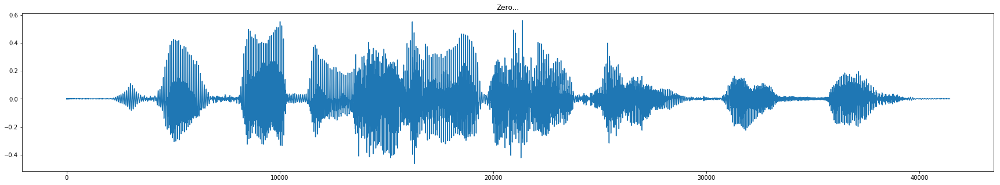

k= 45


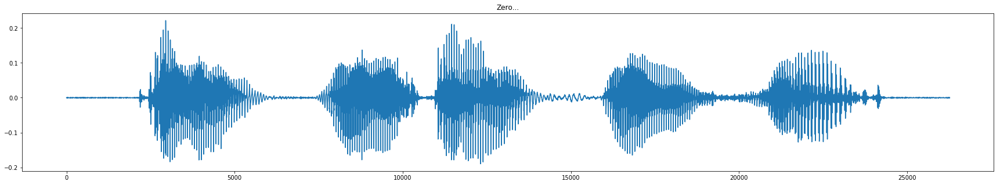

k= 46


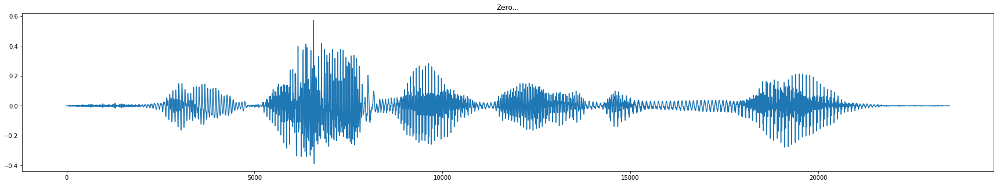

k= 47


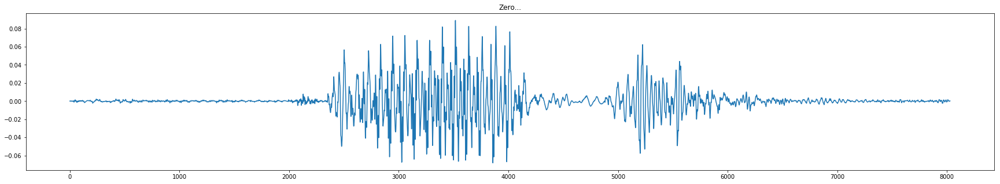

k= 48


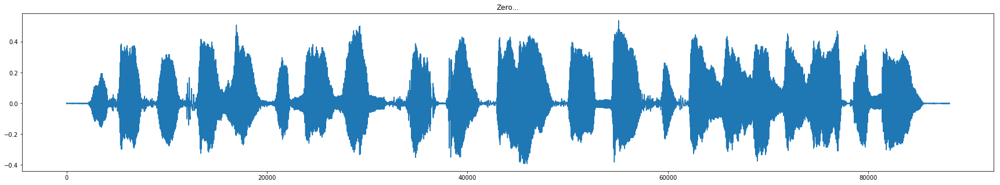

k= 49


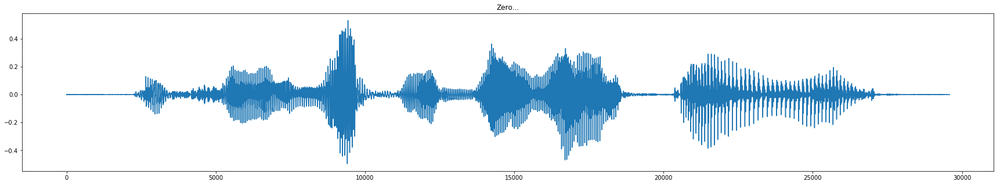

k= 50


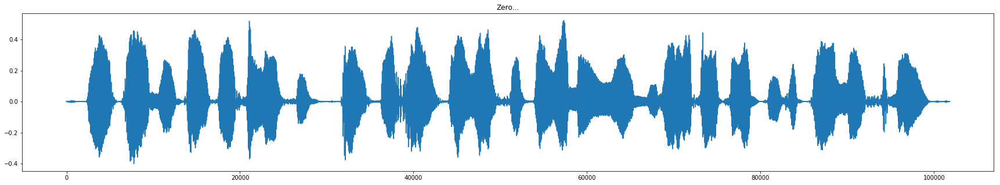

k= 51


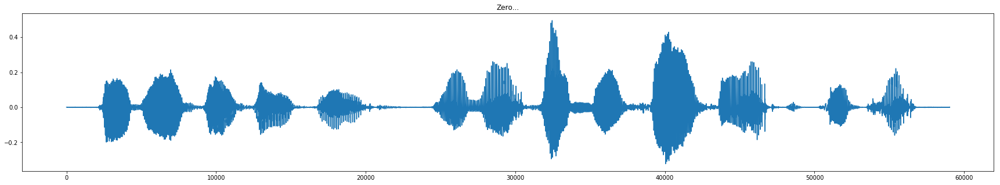

k= 52


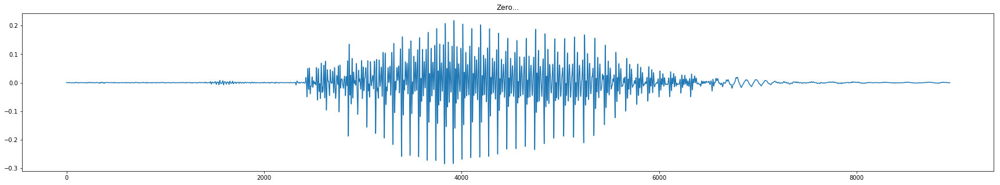

k= 53


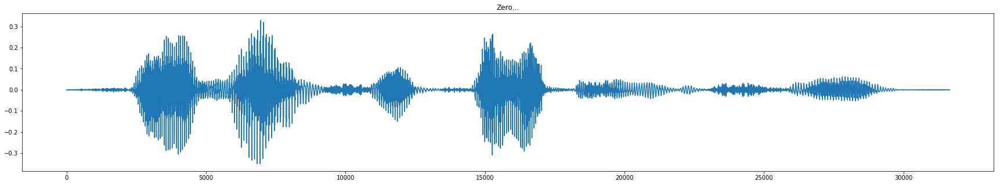

k= 54


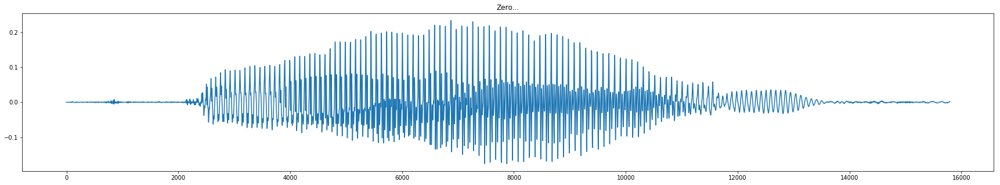

k= 55


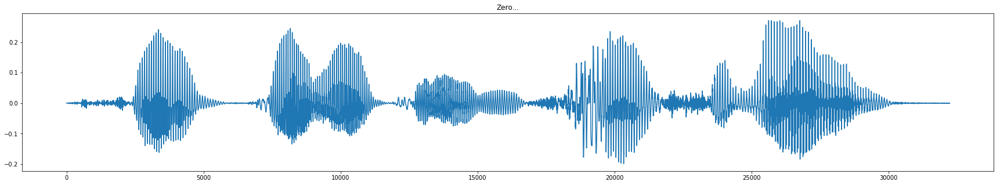

k= 56


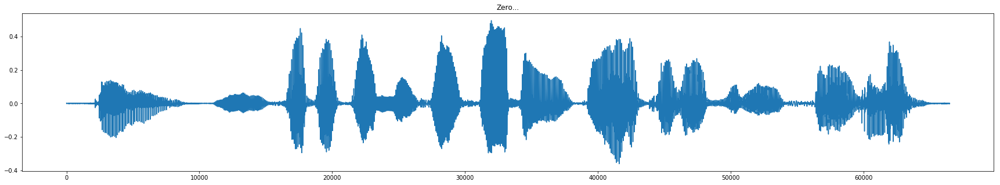

k= 57


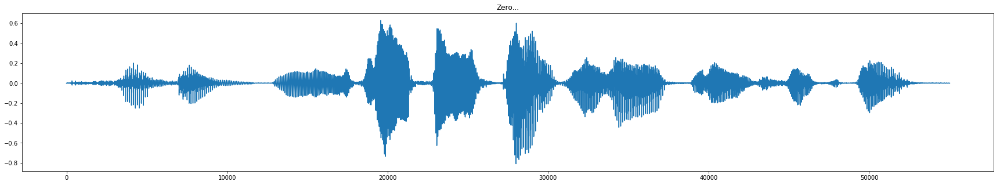

k= 58


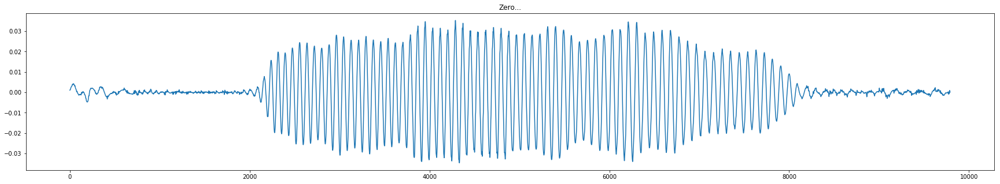

k= 59


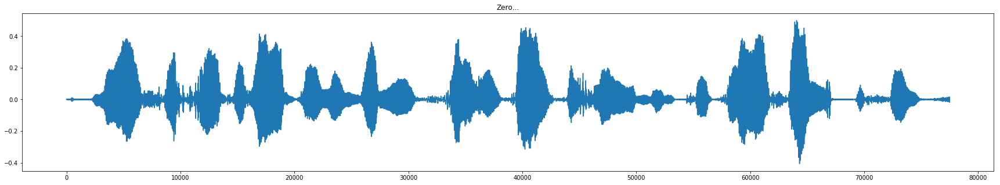

k= 60


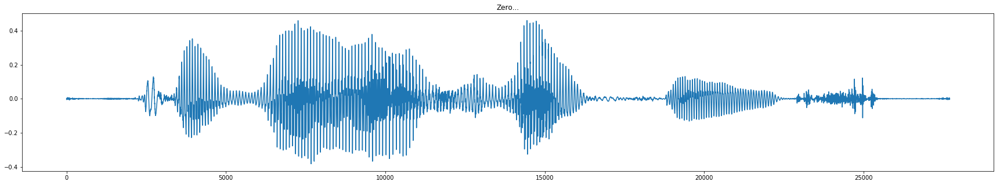

k= 61


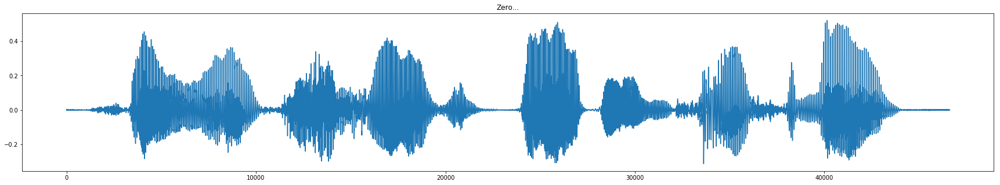

k= 62


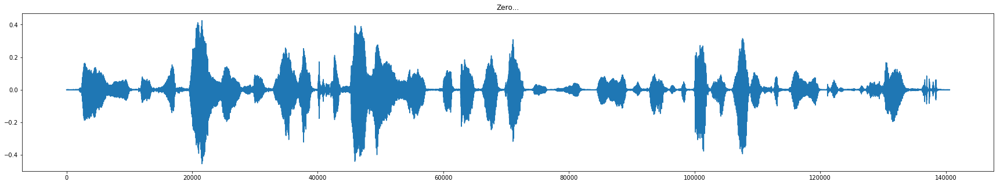

k= 63


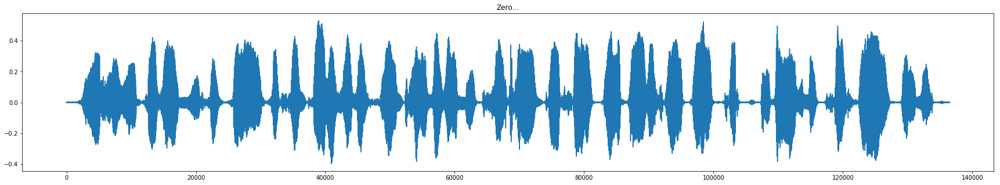

k= 64


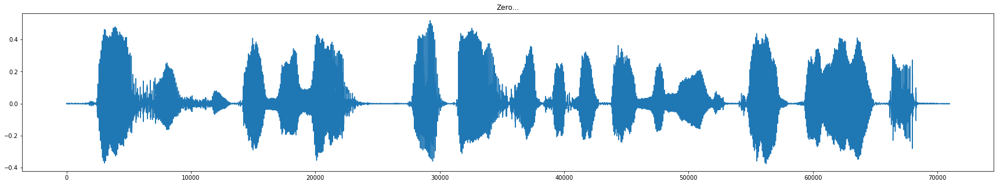

k= 65


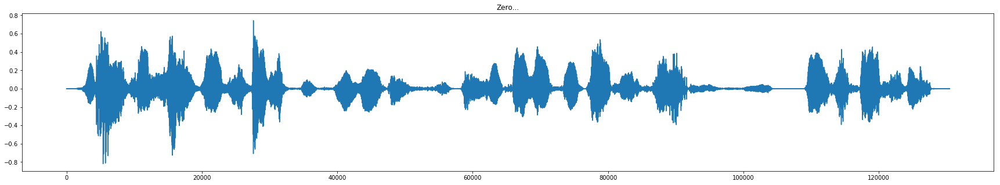

k= 66


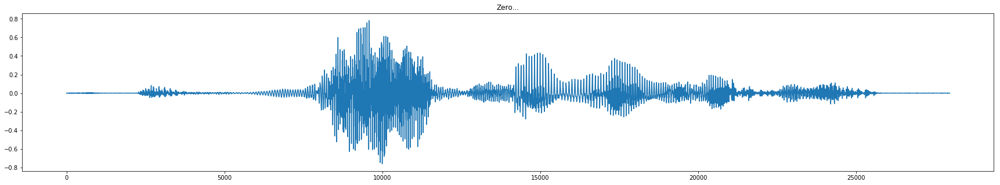

k= 67


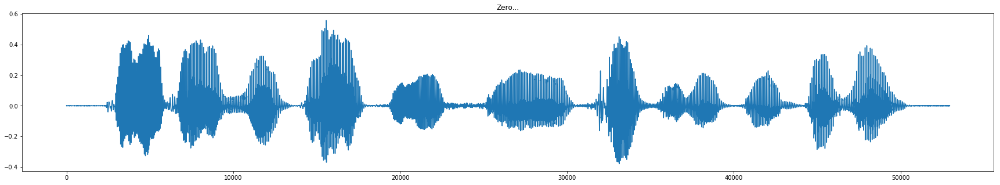

k= 68


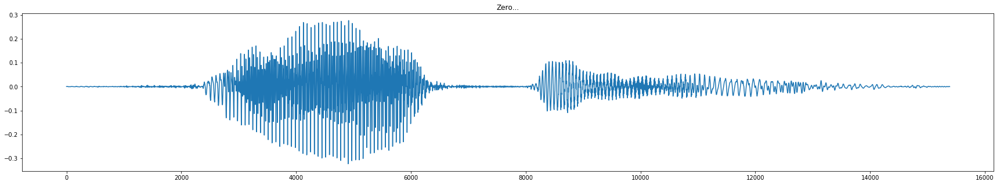

k= 69


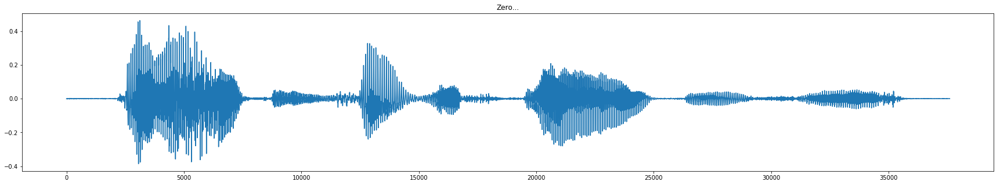

k= 70


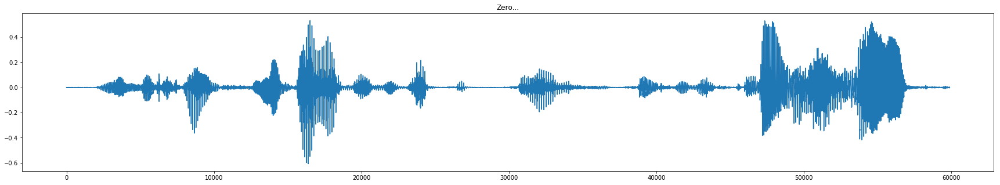

k= 71


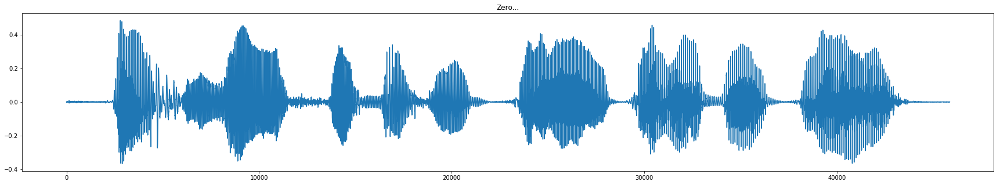

k= 72


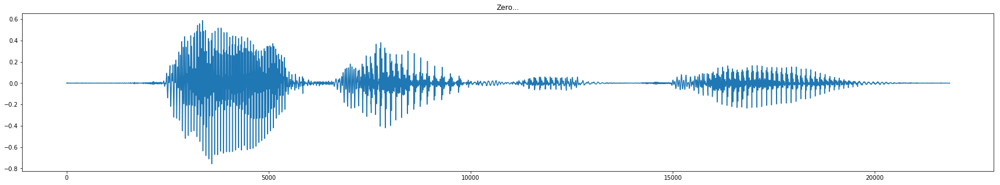

k= 73


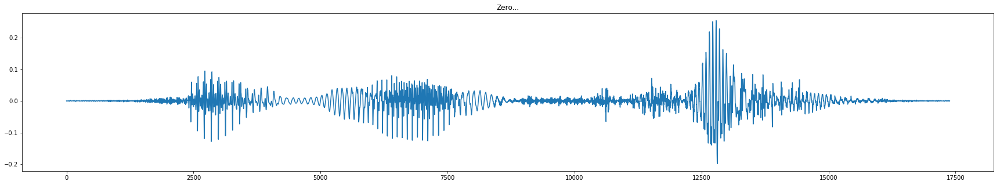

k= 74


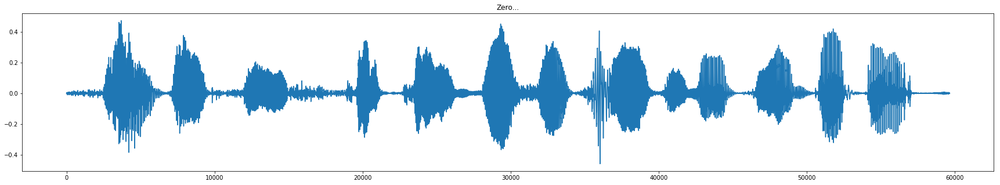

k= 75


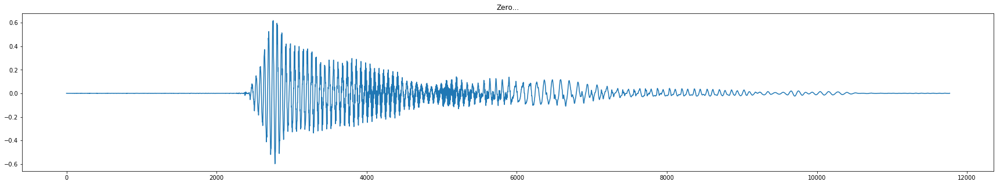

k= 76


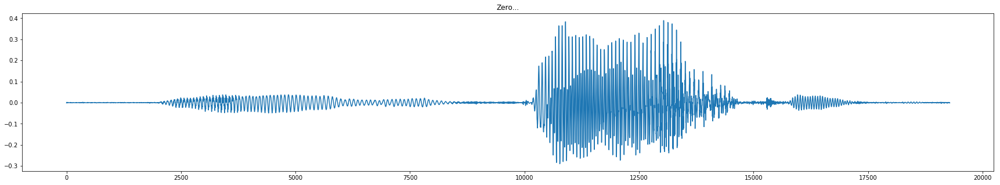

k= 77


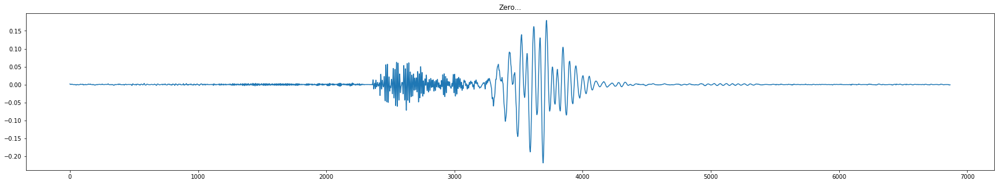

k= 78


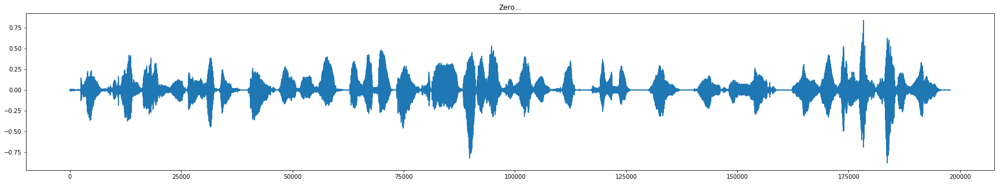

k= 79


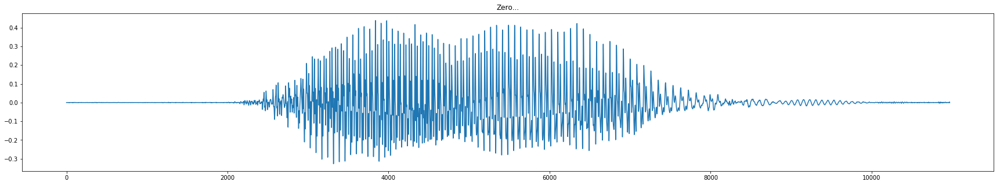

k= 80


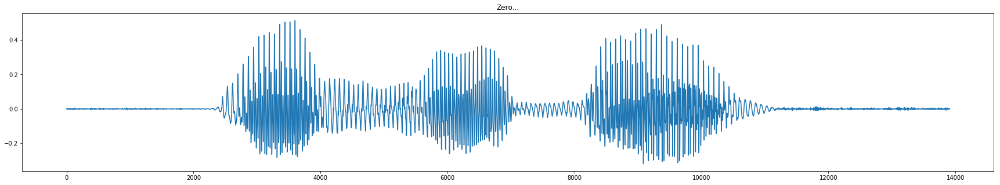

k= 81


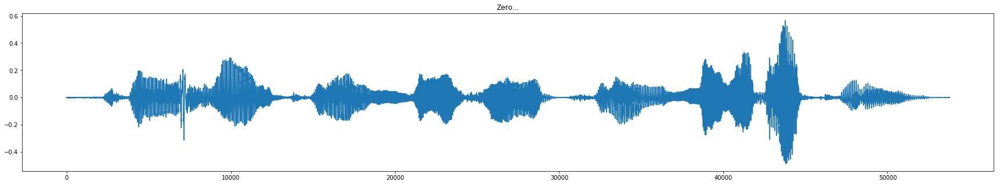

k= 82


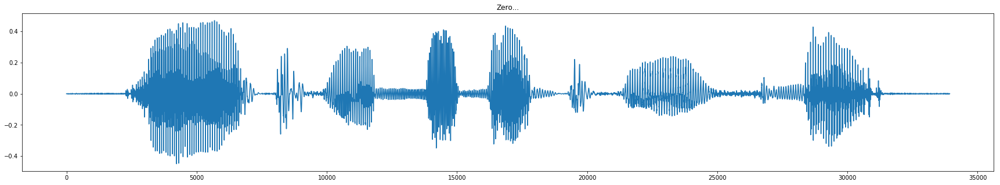

k= 83


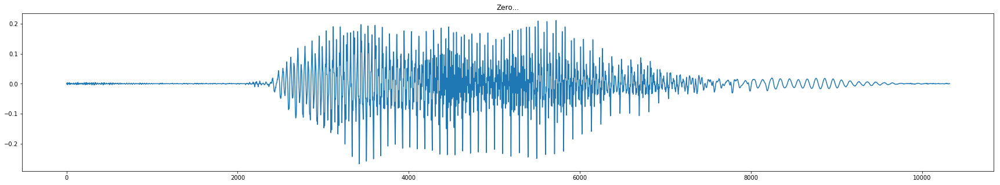

k= 84


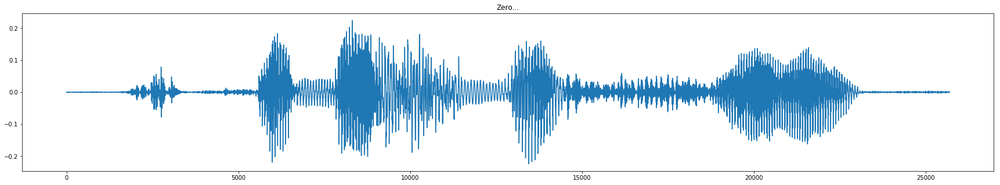

k= 85


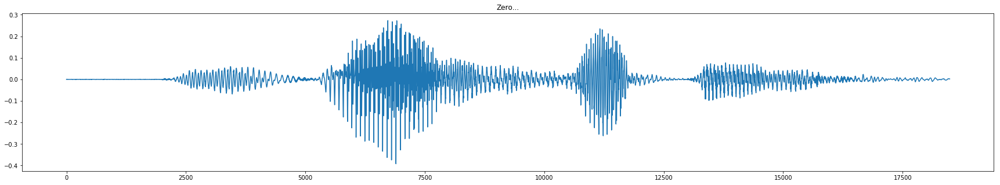

k= 86


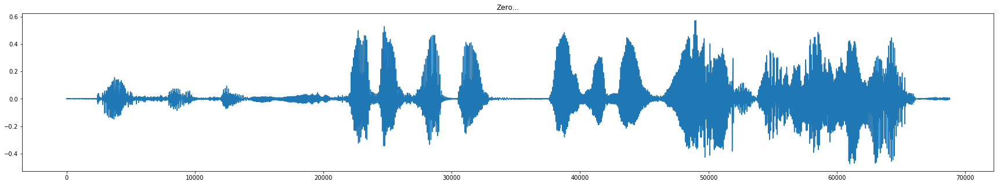

k= 87


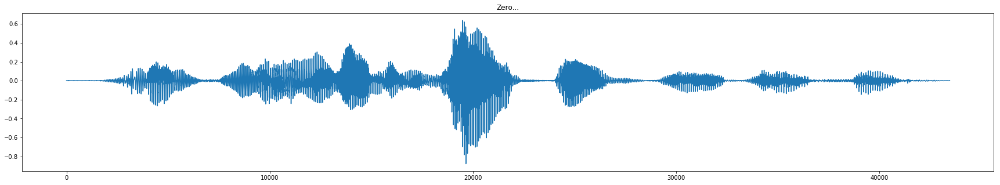

k= 88


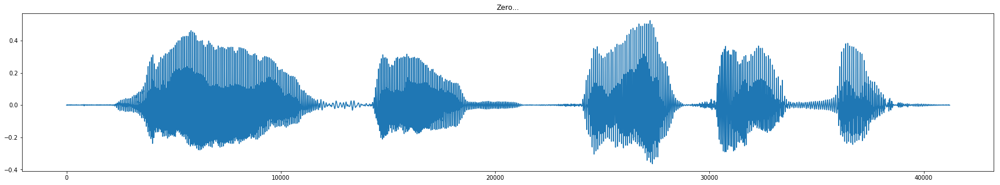

k= 89


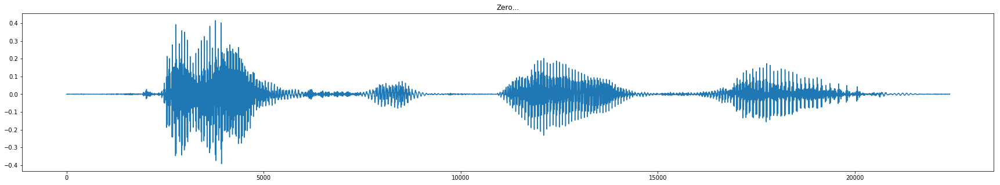

k= 90


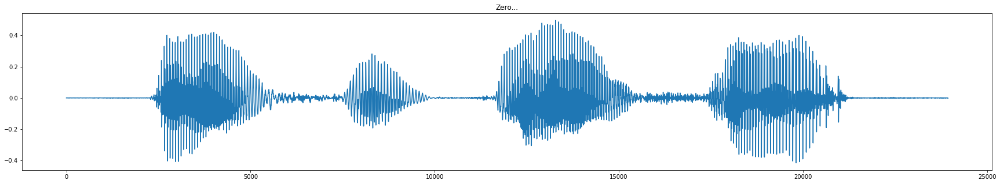

k= 91


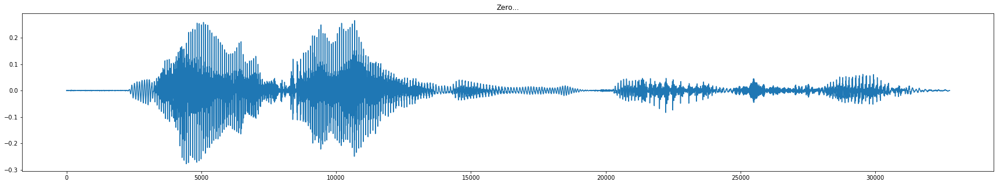

k= 92


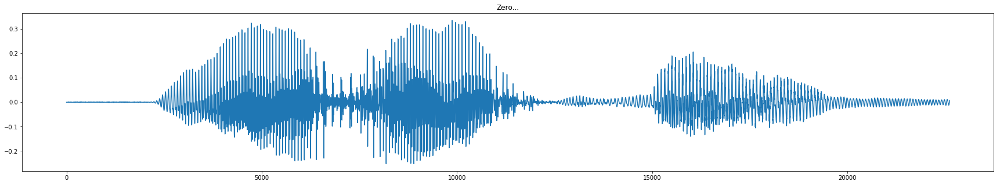

k= 93


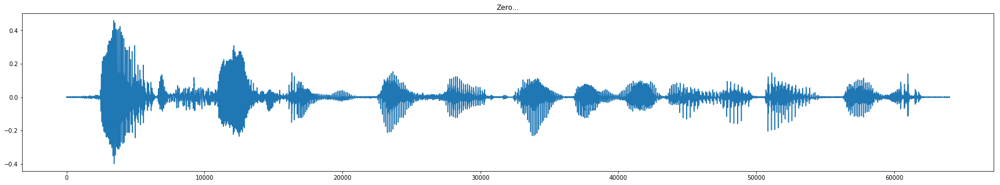

k= 94


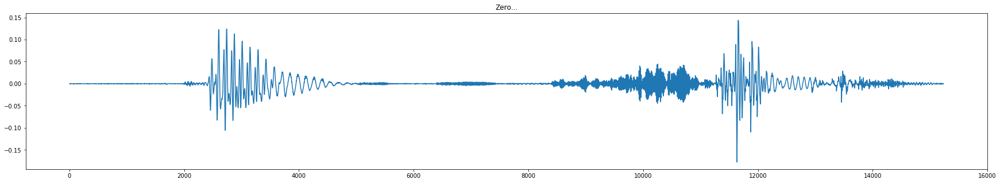

k= 95


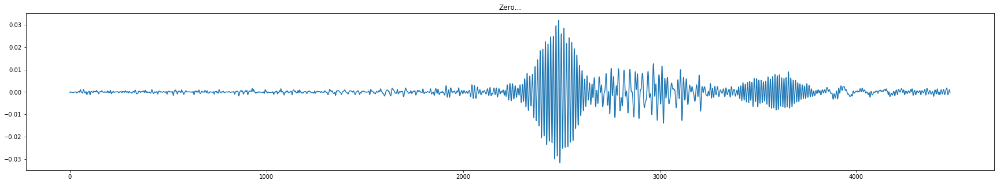

k= 96


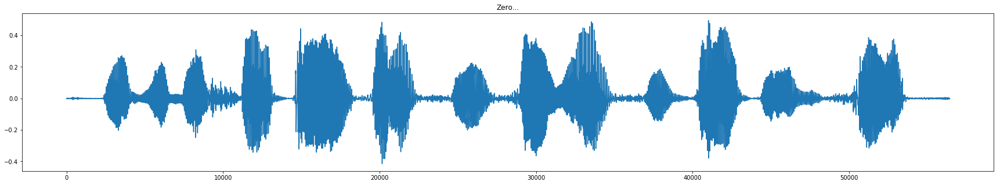

k= 97


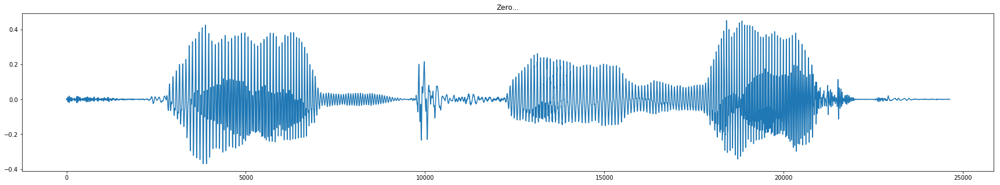

k= 98


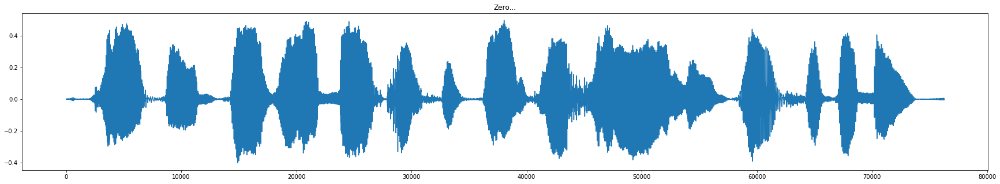

k= 99


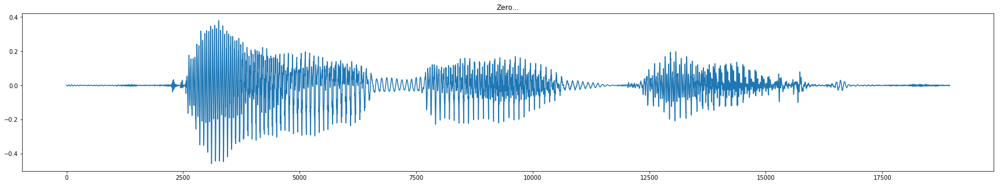

k= 100


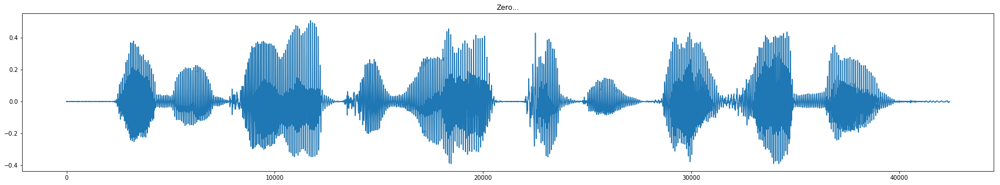

k= 101


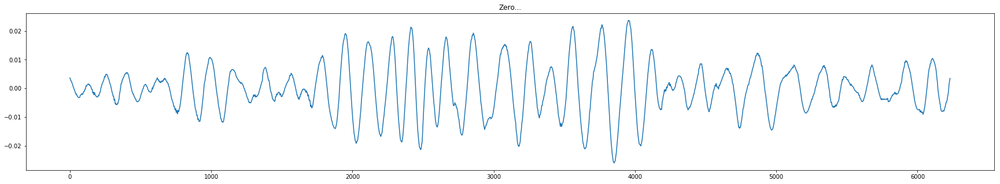

k= 102


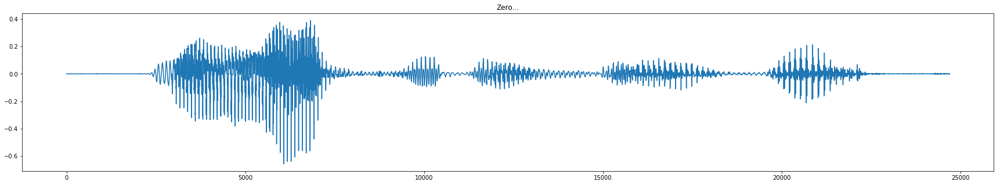

k= 103


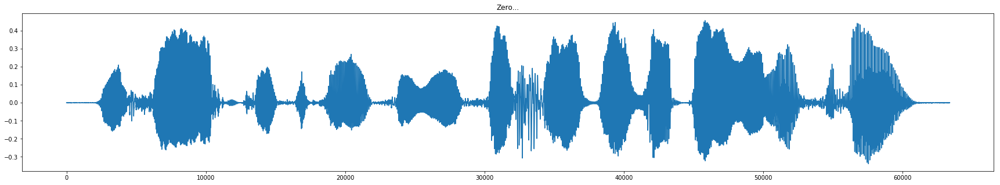

k= 104


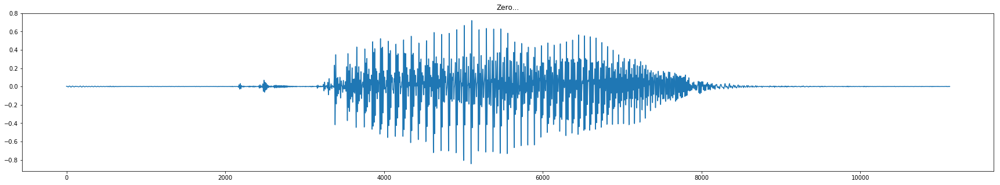

k= 105


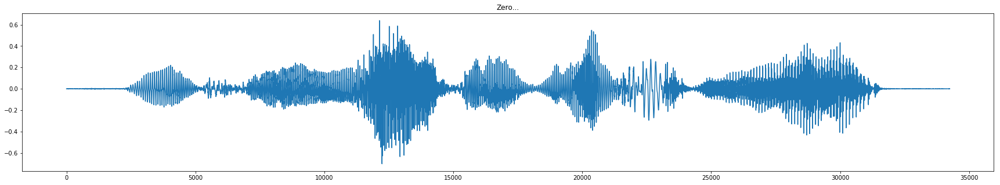

k= 106


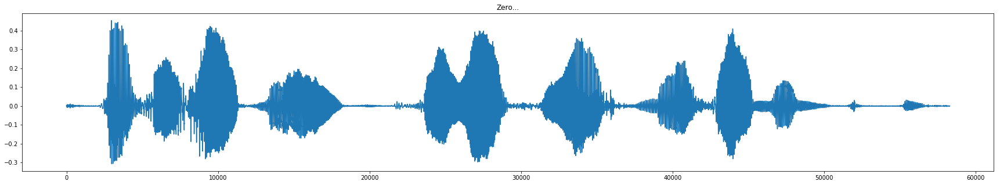

k= 107


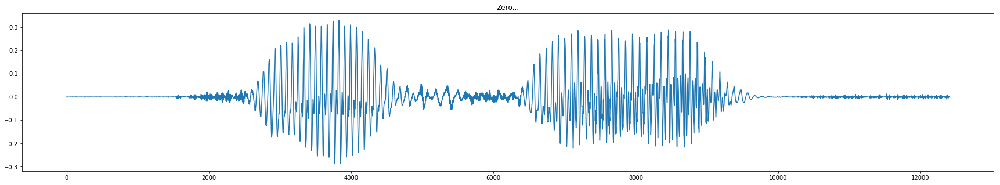

k= 108


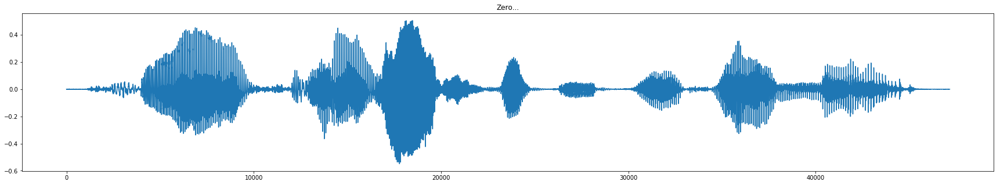

k= 109


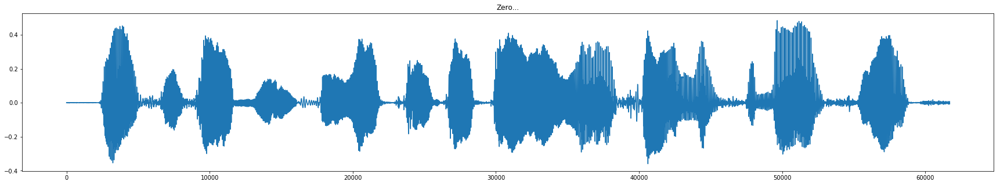

k= 110


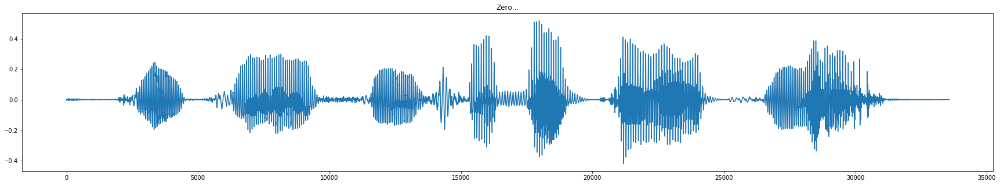

k= 111


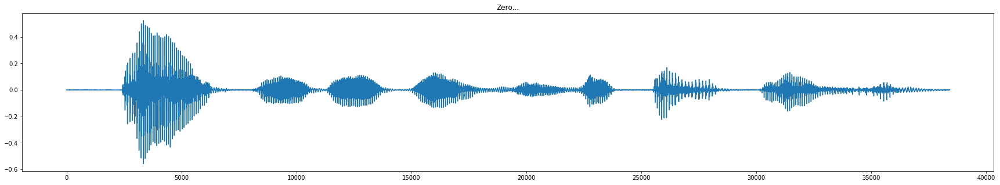

k= 112


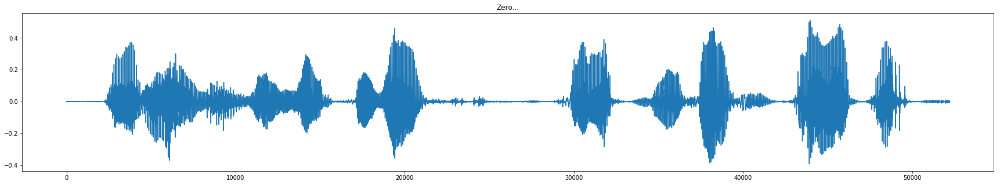

k= 113


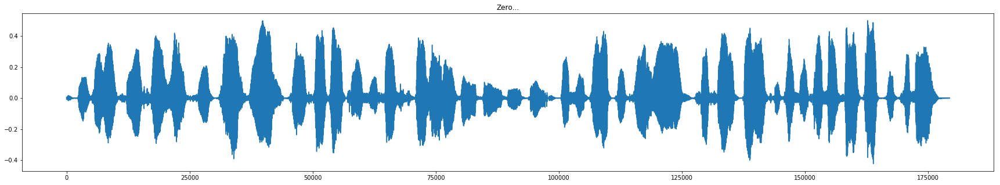

k= 114


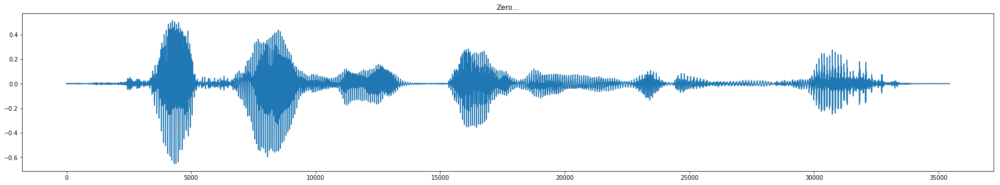

k= 115


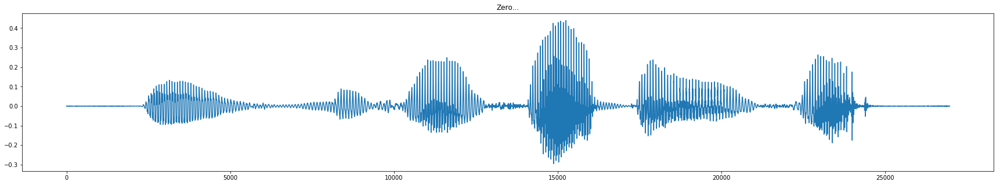

k= 116


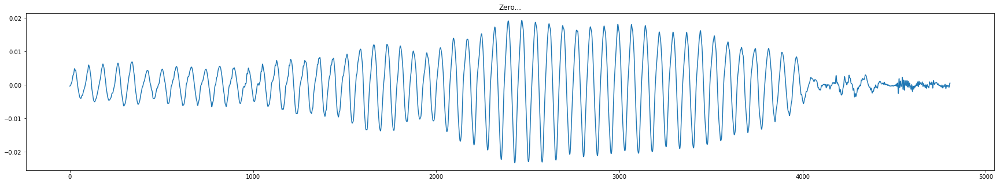

k= 117


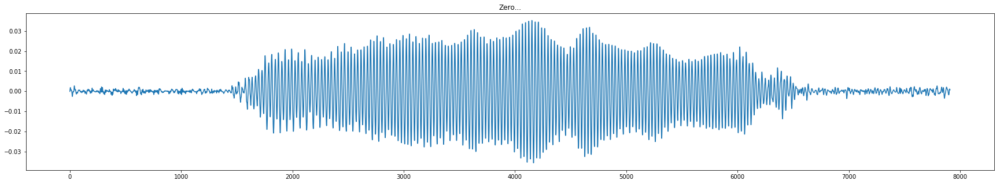

k= 118


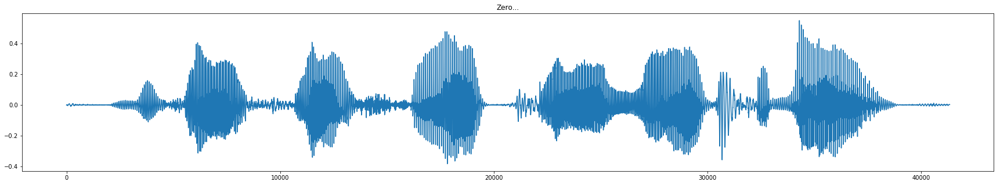

k= 119


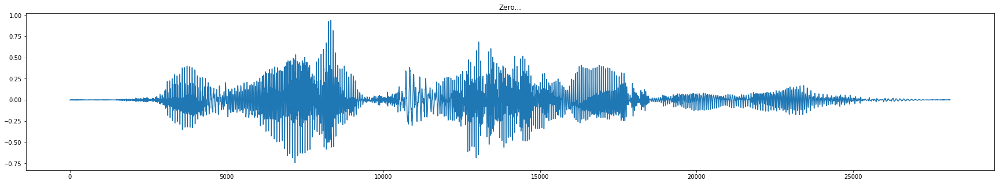

k= 120


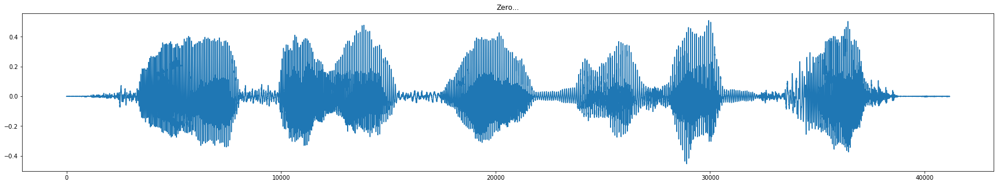

k= 121


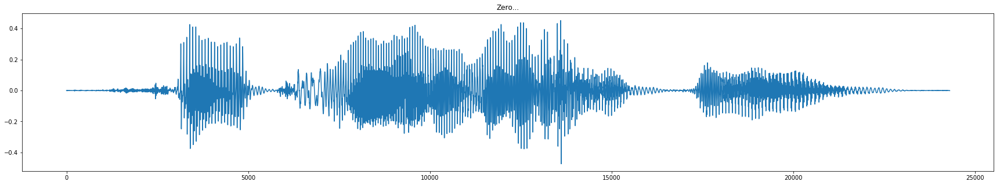

k= 122


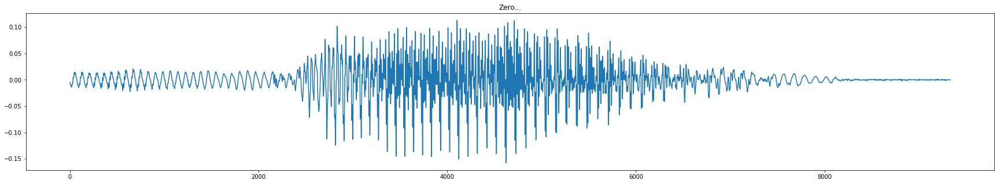

k= 123


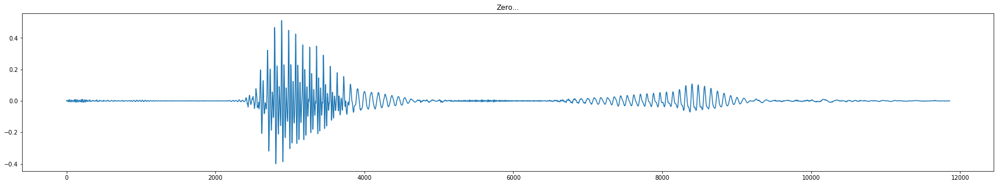

k= 124


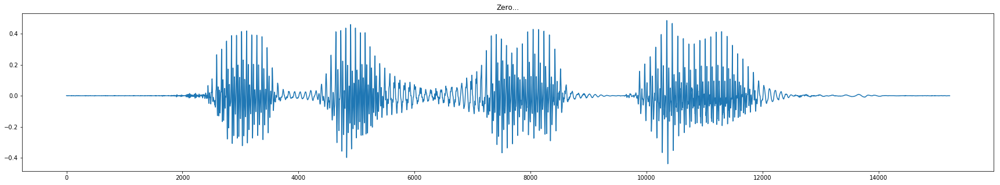

k= 125


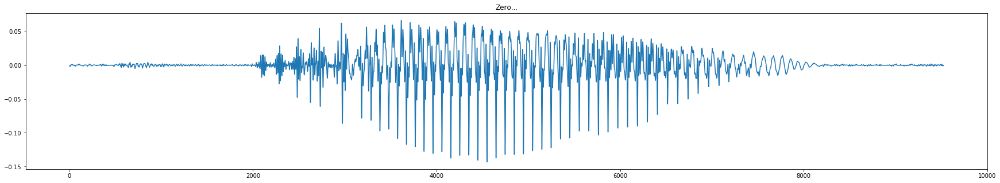

k= 126


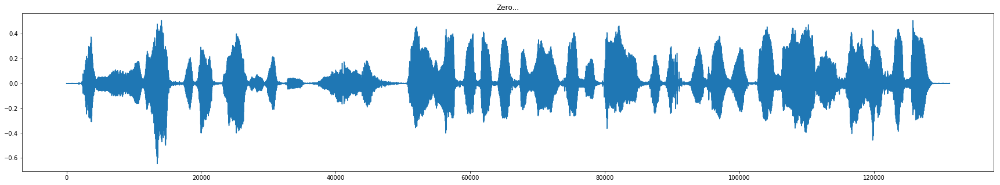

k= 127


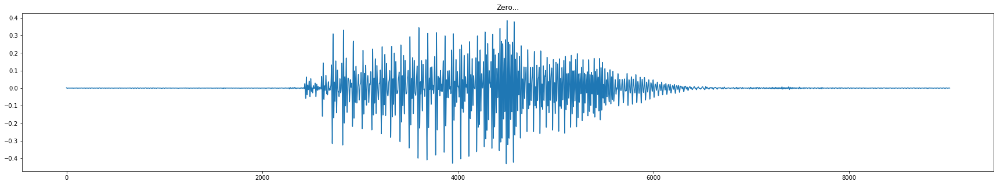

k= 128


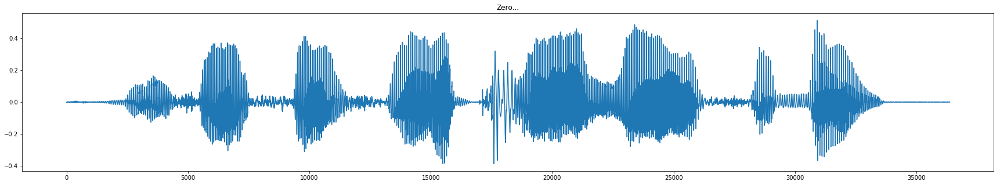

k= 129


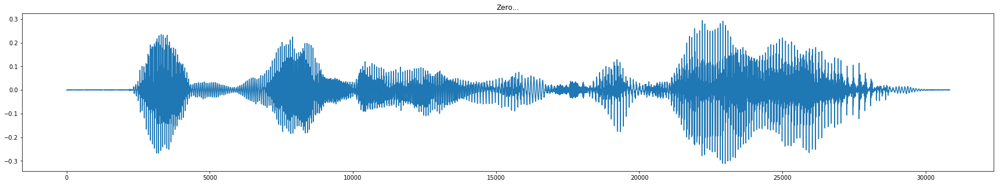

k= 130


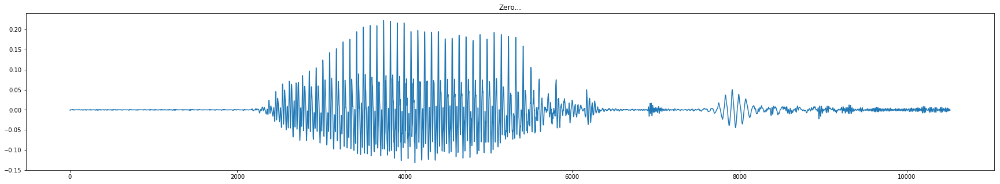

k= 131


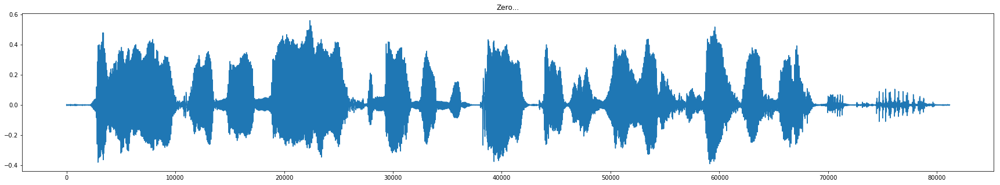

k= 132


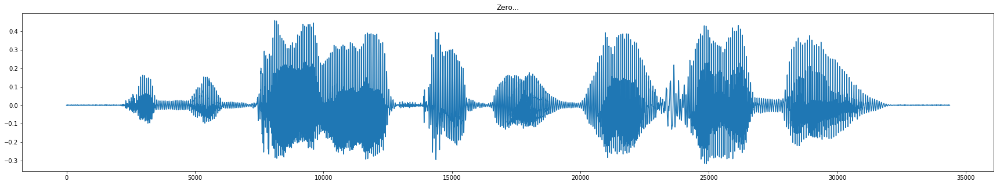

k= 133


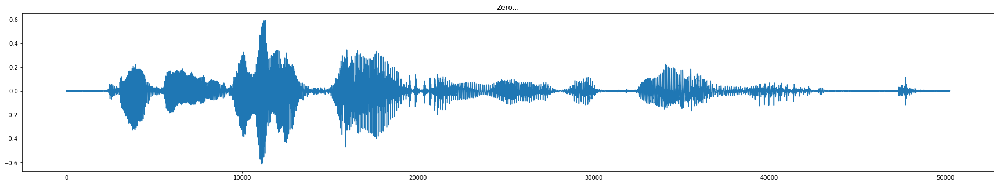

k= 134


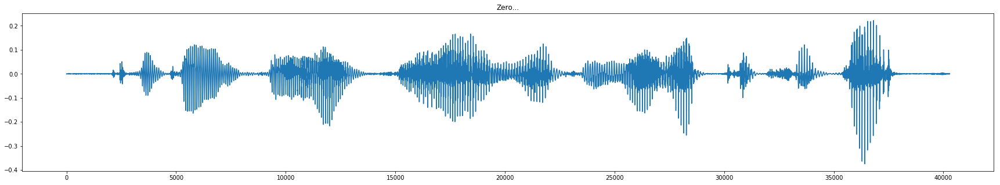

k= 135


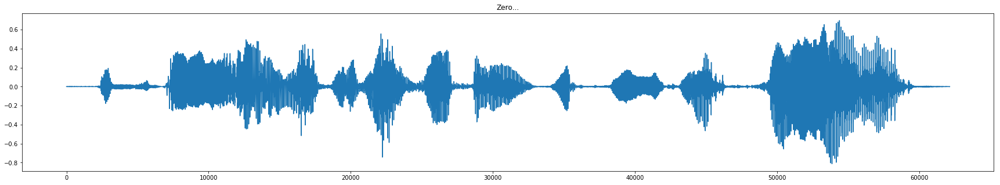

k= 136


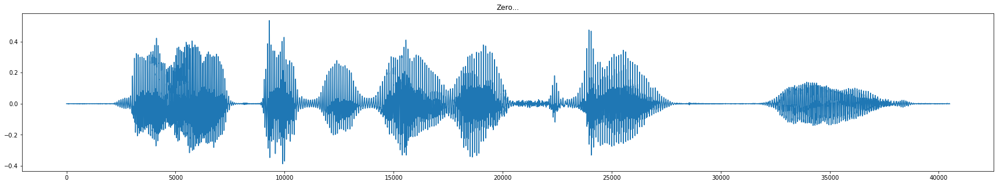

k= 137


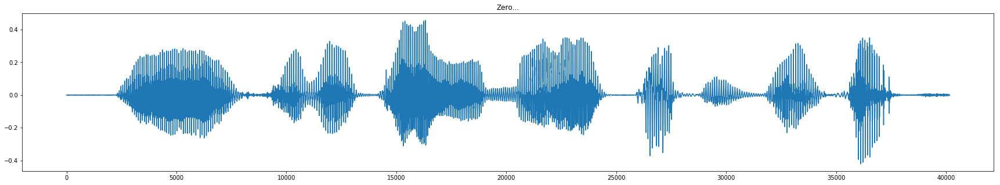

k= 138


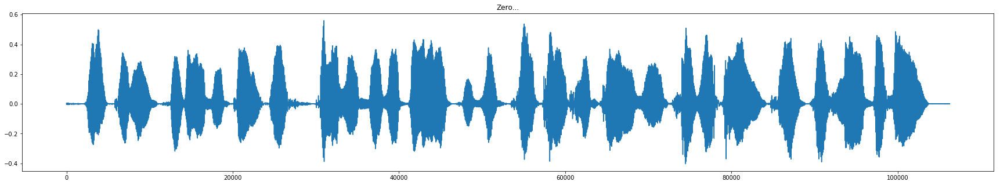

k= 139


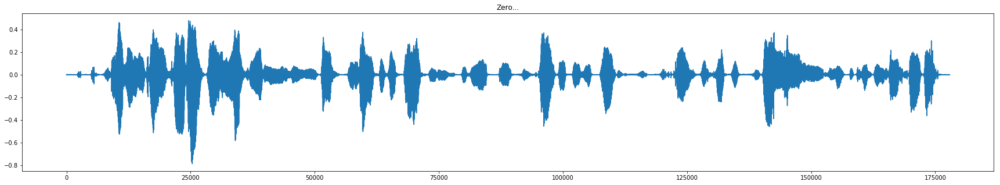

k= 140


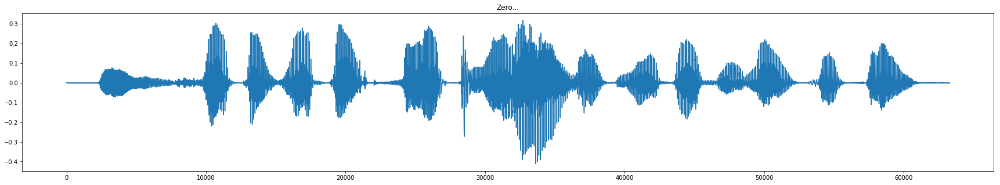

k= 141


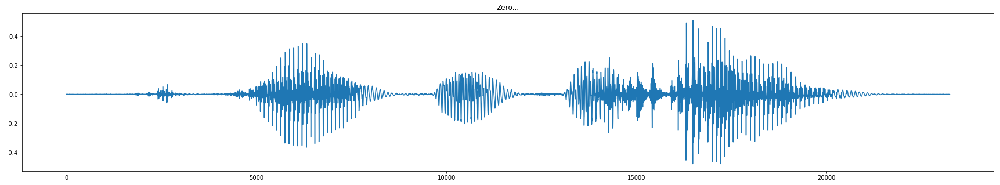

k= 142


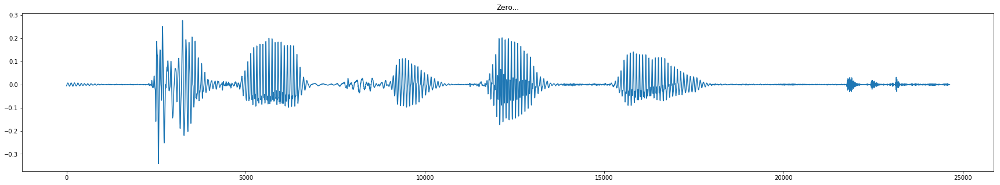

In [102]:
for k in range(len(CUTs)):
#if 1==1:
    print('k=',k)
    X=data[CUTs[k][0]:CUTs[k][1]]
    fig=plt.figure(num=None, figsize=(30, 5), facecolor='w', edgecolor='k')
    plt.title('Zero...')
    plt.plot(X)
    plt.show()
    #fig.savefig(join(ptest_out_slow80,'img{}.png'.format(k)), format='png', dpi=200)#svg

In [97]:
import pyautogui  
#https://chrome.google.com/webstore/detail/keyboard-shortcuts-for-go/akjhnbnjanndggbcegmdggfjjclohjpo/related
pOut_Folder='/home/u/2018/grgDBs/test_out'
ptest_out_slow80='/home/u/2018/grgDBs/test_out_slow80'

if not exists(ptest_out_slow80): os.makedirs(ptest_out_slow80)
    
pWavs_out=glob(join(pOut_Folder,'*.wav'))
pWavs_out=sorted(pWavs_out)
 
len(pWavs_out),pWavs_out

(404,
 ['/home/u/2018/grgDBs/test_out/810920017105505_143_000_(00.0-00.0).wav',
  '/home/u/2018/grgDBs/test_out/810920017105505_143_001_(00.6-01.1).wav',
  '/home/u/2018/grgDBs/test_out/810920017105505_143_002_(01.5-03.5).wav',
  '/home/u/2018/grgDBs/test_out/810920017105505_143_003_(04.3-04.9).wav',
  '/home/u/2018/grgDBs/test_out/810920017105505_143_004_(05.3-08.6).wav',
  '/home/u/2018/grgDBs/test_out/810920017105505_143_005_(08.9-11.2).wav',
  '/home/u/2018/grgDBs/test_out/810920017105505_143_006_(11.8-13.4).wav',
  '/home/u/2018/grgDBs/test_out/810920017105505_143_007_(13.6-15.0).wav',
  '/home/u/2018/grgDBs/test_out/810920017105505_143_008_(15.9-18.9).wav',
  '/home/u/2018/grgDBs/test_out/810920017105505_143_009_(19.8-21.2).wav',
  '/home/u/2018/grgDBs/test_out/810920017105505_143_010_(21.8-25.7).wav',
  '/home/u/2018/grgDBs/test_out/810920017105505_143_011_(26.1-26.6).wav',
  '/home/u/2018/grgDBs/test_out/810920017105505_143_012_(27.2-31.6).wav',
  '/home/u/2018/grgDBs/test_out/

In [94]:
# Convert Audio files to Slowdown them: -------------------
for infile in pWavs_out:
    outfile=infile.replace(pOut_Folder,test_out_slow80) 
    #/home/u/2018/grgDBs/test_out_slow80
    S="ffmpeg -i '{}' -filter:a 'atempo=0.8' -vn '{}'".format(infile,outfile)
    #print(S)
    st=os.system(S)
    if (st!=0):
        print(st)
    


In [51]:
# Get Position of mouse, run one time: -------------------
# Open translate.google.cn, half-left it, put mouse on that window area then run:
x, y = pyautogui.position()
positionStr = 'X: ' + str(x).rjust(4) + ' Y: ' + str(y).rjust(4)
print(positionStr, end='')
print('\b' * len(positionStr), end='', flush=True)
# half left size: X: 1772 Y:  41

X: 2275 Y:  756

In [99]:
# Auto Speech recognition by tool:
# plug Audio line out to line in then run:
import timeit

test_out_slow80=glob(join(ptest_out_slow80,'*.wav'))
test_out_slow80=sorted(test_out_slow80)
Trans=[]
t=randint(3,5)
for k,fn in enumerate(test_out_slow80):
    pyautogui.click(x,y)
    time.sleep(t)
    pyautogui.hotkey('alt', 'm')
    #print('hotkey m.')
    start = timeit.default_timer()
    song = AudioSegment.from_wav(fn)
    play(song)
    stop = timeit.default_timer()
    tt=stop - start 
    time.sleep(t+tt/2)
    
    pyautogui.click(x,y)
    time.sleep(tt/2)
    #pyautogui.click(x-100,y+10)
    #time.sleep(tt/2)
    
    pyautogui.hotkey('alt', 'm')
    pyautogui.hotkey('ctrl', 'c')
    #pyautogui.hotkey('ctrl', 'a')
    #pyautogui.hotkey('ctrl', 'x')
    pyautogui.hotkey('alt', 'd')
    vl=pyperclip.paste()
    print(k,':',vl)
    Trans.append(vl)
    pyperclip.copy("")
    time.sleep(t)
    if k%10==0:
        pyautogui.hotkey('f5')
        time.sleep(3)

0 : time.sleep(t)
1 : 喂
2 : 那不是已经有事吗
3 : 哪里
4 : 如何做普通银行卡中心
5 : 非核对后的
6 : 奥迪A1给你说一下
7 : 你没有变动
8 : 明天是什么天气预报
9 : 家里地址
10 : 我不是QQ看我是写的是寄到家里对吧
11 : 对
12 : 给我地址有变动我就想你们不会打电话核实
13 : 你好
14 : 2tu.cc没听出什么呢
15 : 嘉禾建设
16 : 
17 : 他为什么吗
18 : 打架核电设工程设计工程有限公司啊
19 : OK
20 : 你是通过什么渠道申请还是可以吗
21 : 准备吃吗
22 : 对
23 : 这次是通过上网吧
24 : 网上
25 : 好的我媳妇的话
26 : 
27 : 那里
28 : 
29 : 明天天不是在上海市闵行区
30 : 奥巴马
31 : 百度一下
32 : 26
33 : 耳朵会让我想想
34 : 163
35 : 哎呀我都忘了那个地址了23号什么
36 : 6 0 1 23号601
37 : 冰雪融化
38 : 四
39 : 是上海市闵行区放鹤路的吗
40 : 喂
41 : 数量不对啊
42 : 我忘了
43 : 阿
44 : 你说的话我都删了
45 : 2323号
46 : 19号601
47 : 对的
48 : 福州市上海市闵行区23 23 23号有没有去吗
49 : 不是我现在要改
50 : 宝贝你该睡觉了
51 : 对对对对对
52 : 2
53 : 上海市嘉定区
54 : 
55 : 水加进去是吗
56 : 好的我等一下这个年龄
57 : 好的你要过来不然收不到
58 : 
59 : 搜索周杰伦的你写一下载QQ
60 : 现在我很高兴咯
61 : 上海市嘉定区
62 : 对于壁纸换了那天我看到了我没办法改壁纸所以我就想你打电话的时候我跟你们说一下
63 : 因为不知你是否还能修改如果你卡通QQ改变的话就会把我们客服热线
64 : 做爱时间那个照片我都不见了你可以作用
65 : 那帮我记错了
66 : YouTube
67 : 老板人家解释最近的住宿吗
68 : 约定
69 : 回家就是
70 : 那个很复杂的那个家这是哪个
71 : QQ是不是家长的家
72 : 发表的家
73 : 好像是吧
74 : 我的舰队吧
75 : 病
76 : 军队


aa, bb = pyautogui.position()
positionStr = 'X: ' + str(aa).rjust(4) + ' Y: ' + str(bb).rjust(4)
print(positionStr, end='')
print('\b' * len(positionStr), end='', flush=True)


In [103]:
# Save labels text to files:
for k, ff in enumerate(test_out_slow80):
    with open(ff.replace('.wav','.txt'),'w') as fout:
        fout.write(Trans[k])
    print(Trans[k])

time.sleep(t)
喂
那不是已经有事吗
哪里
如何做普通银行卡中心
非核对后的
奥迪A1给你说一下
你没有变动
明天是什么天气预报
家里地址
我不是QQ看我是写的是寄到家里对吧
对
给我地址有变动我就想你们不会打电话核实
你好
2tu.cc没听出什么呢
嘉禾建设

他为什么吗
打架核电设工程设计工程有限公司啊
OK
你是通过什么渠道申请还是可以吗
准备吃吗
对
这次是通过上网吧
网上
好的我媳妇的话

那里

明天天不是在上海市闵行区
奥巴马
百度一下
26
耳朵会让我想想
163
哎呀我都忘了那个地址了23号什么
6 0 1 23号601
冰雪融化
四
是上海市闵行区放鹤路的吗
喂
数量不对啊
我忘了
阿
你说的话我都删了
2323号
19号601
对的
福州市上海市闵行区23 23 23号有没有去吗
不是我现在要改
宝贝你该睡觉了
对对对对对
2
上海市嘉定区

水加进去是吗
好的我等一下这个年龄
好的你要过来不然收不到

搜索周杰伦的你写一下载QQ
现在我很高兴咯
上海市嘉定区
对于壁纸换了那天我看到了我没办法改壁纸所以我就想你打电话的时候我跟你们说一下
因为不知你是否还能修改如果你卡通QQ改变的话就会把我们客服热线
做爱时间那个照片我都不见了你可以作用
那帮我记错了
YouTube
老板人家解释最近的住宿吗
约定
回家就是
那个很复杂的那个家这是哪个
QQ是不是家长的家
发表的家
好像是吧
我的舰队吧
病
军队

那肯定一定的定云屏路
二
然后呢
PK苹果4屏幕的平
二屏幕的天是吗
对
上面有不湿
给下一个病
好的好的然后呢
灵岩路1399弄
1399弄
23号
23号
1209室
120
富士23号1399弄23号
是的

我说你何必再说上海市嘉定区
临平路
1399弄23号12094对吗
背对的
那你对了不具有飞机叫唤吗
那你对了不具有飞机叫唤吗
没有固定电话
如果把我去哪

你觉
不过你现在是你说明
谢谢
厕所那里的地址换了
丰富圈明星的工作单位换了是吗是
之前是什么国家
对对对那个上换了
加载
你这是上海市嘉和建设工程所需对吧
合川路3050号
你先说等一下


最适合嵌入式吗
Hello Hello
现在是女孩子
好漂亮


好的好的

你又不到家里的地址啊我觉得就是问一下你就是说然后呢

明天适合天为什么
3050号呀
阿
没有我会吗没

In [251]:
#Create HTML file to test result:

ss='<hr/><br/>	\
<button onclick="{7}()" type="button">{0}</button>\
<text id="{8}"></text> \
<div id="{0}"> \
	<audio id="{1}"><source src="{2}" type="audio/mpeg"></audio> \
	<button onclick="{3}()" type="button">Play Audio</button> \
	<input id="{4}" type="text" size="80" onkeydown="{5}(event)" value="{6}"> \
	<script> \
		var {10} = document.getElementById("{1}");  \
		function {3}() @ {10}.play(); $  \
		function {9}()@ {10}.pause();$ \
		function {7}()@ \
			document.getElementById("{8}").innerHTML = "OK!";\
            var vv=document.getElementById("{0}").style.display;\
            if (vv!="none")@document.getElementById("{0}").style.display = "none";$\
            else @document.getElementById("{0}").style.display = "inline";$\
			$\
		function {5}(event) @\
			var x =  event.keyCode; \
			if (x == 27) @{3}();$\
			if (x == 17) @{9}();$\
		$\
	</script>\
</div>'

ss1=''
for k,ff in enumerate(test_out_slow80):
    ss1+=ss.format( 'Audio %s'%k,
                  'au%s'%k,
                  ff.split('/')[-1],
                  'pAu%s'%k,
                  'tact%s'%k,
                  'PLAY%s'%k,
                  Trans[k],
                  'save%s'%k,
                  'ok%s'%k,
                  'pausA%s'%k,
                  'x%s'%k)
ss1=ss1.replace('@','{')
ss1=ss1.replace('$','}')
ssfile='<!DOCTYPE html>\
<html>\
<body>\
<p>1. Click on text <br/>\
2. Press ESC to play audio<br/>\
3. Press CTR to pause</p>'

ssfileend='</body></html>'
with open(join(ptest_out_slow80,'00.html'),'w') as ff:
    ff.write(ssfile)
    ff.write(ss1)
    ff.write(ssfileend)     
print('View result in:',join(ptest_out_slow80,'00.html'))    